## Full Modeling, Evaluatin and Explainability Pipelin:


1) Patient-based holdout split (random_state=42)
   
2) GroupKFold (n_splits=4) on TRAIN only (groups=anon_id)
       
3) Hyperparameter tuning (Optuna) using GroupKFold CV scores
      
4) Fit final (refit) model on full TRAIN with best_params
      
5) Calibration (isotonic) with group-aware CV splits (TRAIN only)
      
6) Threshold selection from OOF calibrated probabilities (group-aware, TRAIN only)
      
7) Evaluate once on held-out TEST (X_test_clean only)
      
8) Patient-level bootstrap 95% CI on TEST only (for all models)
      
9) Calibration assessment on TEST
      - Expected Calibration Error (ECE)
      - Reliability / calibration curves
      
10) Statistical comparison of model discrimination
      - DeLong test for ROC-AUC differences between models
      
11) Statistical comparison of classification outcomes
      - McNemar test on paired predictions between models
      
12) Clinical utility analysis
      - Decision Curve Analysis (DCA)
      - Net benefit across threshold probabilities
      
13) Model explainability
      - SHAP value computation for tree-based models
      - Global feature importance
      - SHAP summary plots and feature contribution analysis


> Note: At the end of this notebook, a detailed description of the full dataflow pipeline is provided. Please refer to it if needed.

In [1]:
import pandas as pd

df = pd.read_parquet("merged_sample_one_processed/final_stage/part.0.parquet")
print(f"Shape: {df.shape}")

Shape: (1213641, 71)


In [2]:
df.info()

<class 'pandas.DataFrame'>
RangeIndex: 1213641 entries, 0 to 1213640
Data columns (total 71 columns):
 #   Column                   Non-Null Count    Dtype  
---  ------                   --------------    -----  
 0   anon_id                  1213641 non-null  string 
 1   pat_enc_csn_id_coded     1213641 non-null  int64  
 2   order_proc_id_coded      1213641 non-null  int64  
 3   order_time_jittered_utc  1213641 non-null  string 
 4   organism                 1213641 non-null  int8   
 5   antibiotic               1213641 non-null  int8   
 6   susceptibility           1213641 non-null  Int8   
 7   med_within_30_days       1131261 non-null  boolean
 8   n_med_categories         1131261 non-null  float64
 9   min_time_to_med          1131261 non-null  Int32  
 10  age                      1213641 non-null  Int8   
 11  gender                   1213641 non-null  Int8   
 12  Period_Day               1152187 non-null  Int64  
 13  Q25_wbc                  1142011 non-null  float32
 1

In [3]:
df['susceptibility'].value_counts(dropna=False)

susceptibility
0    827853
1    385788
Name: count, dtype: Int64

### Patient-based holdout split

In [4]:
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split

RANDOM_STATE = 42
TARGET_COL = "susceptibility"
GROUP_COL  = "anon_id"

ID_COLS = [
    "anon_id",
    "pat_enc_csn_id_coded",
    "order_proc_id_coded",
    "order_time_jittered_utc",
]

df = df.copy()

# 1) ensure patient id is plain python string (avoid Arrow indexing issues)
df[GROUP_COL] = df[GROUP_COL].astype(str)

# 2) patient ids as NUMPY array (key fix)
patient_ids = df[GROUP_COL].dropna().astype(str).unique().to_numpy()

train_patients, test_patients = train_test_split(
    patient_ids,
    test_size=0.2,
    random_state=RANDOM_STATE
)

# 3) build train/test dfs
train_df = df[df[GROUP_COL].isin(train_patients)].reset_index(drop=True)
test_df  = df[df[GROUP_COL].isin(test_patients)].reset_index(drop=True)

# 4) sanity: no overlap
assert set(train_patients).isdisjoint(set(test_patients))

print("Train patients:", train_df[GROUP_COL].nunique(), " Train rows:", len(train_df))
print("Test patients :", test_df[GROUP_COL].nunique(),  " Test rows :", len(test_df))

# 5) features/labels/groups
X_train = train_df.drop(columns=[TARGET_COL] + ID_COLS, errors="ignore")
y_train = train_df[TARGET_COL].astype(int)
g_train = train_df[GROUP_COL].to_numpy()

X_test  = test_df.drop(columns=[TARGET_COL] + ID_COLS, errors="ignore")
y_test  = test_df[TARGET_COL].astype(int)
g_test  = test_df[GROUP_COL].to_numpy()

print("X_train shape:", X_train.shape, "X_test shape:", X_test.shape)
print("Overlap patients:",
      set(train_df["anon_id"]).intersection(set(test_df["anon_id"])))

Train patients: 797  Train rows: 1040521
Test patients : 200  Test rows : 173120
X_train shape: (1040521, 66) X_test shape: (173120, 66)
Overlap patients: set()


### GroupKFold CV object (inside train)

In [5]:
from sklearn.model_selection import GroupKFold

CV_FOLDS = 4  
gkf = GroupKFold(n_splits=CV_FOLDS)

# Example: loop to confirm it works
for fold, (tr_idx, va_idx) in enumerate(gkf.split(X_train, y_train, groups=g_train), start=1):
    tr_patients = len(set(g_train[tr_idx]))
    va_patients = len(set(g_train[va_idx]))
    overlap = len(set(g_train[tr_idx]).intersection(set(g_train[va_idx])))

    print(f"Fold {fold}: train_rows={len(tr_idx)} val_rows={len(va_idx)} "
          f"| train_patients={tr_patients} val_patients={va_patients} overlap={overlap}")

Fold 1: train_rows=780390 val_rows=260131 | train_patients=629 val_patients=168 overlap=0
Fold 2: train_rows=780390 val_rows=260131 | train_patients=593 val_patients=204 overlap=0
Fold 3: train_rows=780393 val_rows=260128 | train_patients=585 val_patients=212 overlap=0
Fold 4: train_rows=780390 val_rows=260131 | train_patients=584 val_patients=213 overlap=0


In [6]:
import numpy as np
import pandas as pd

def make_model_ready(X: pd.DataFrame) -> pd.DataFrame:
    X = X.copy()

    # 1) Replace pandas NA (NAType) with np.nan
    X = X.replace({pd.NA: np.nan})

    # 2) Convert nullable integer/float extension dtypes to numpy floats
    # (XGBoost handles np.nan in float columns)
    for col in X.columns:
        if pd.api.types.is_integer_dtype(X[col]) and str(X[col].dtype).startswith("Int"):
            X[col] = X[col].astype("float32")
        elif pd.api.types.is_bool_dtype(X[col]) and str(X[col].dtype) == "boolean":
            # boolean extension dtype -> float (or int)
            X[col] = X[col].astype("float32")
        elif pd.api.types.is_string_dtype(X[col]) or str(X[col].dtype) == "string":
            # You should not have strings in X now; if you do, drop/encode them
            raise ValueError(f"String column still in X: {col}")

    # 3) Finally, ensure everything numeric
    bad = X.select_dtypes(exclude=["number"]).columns.tolist()
    if bad:
        raise ValueError(f"Non-numeric columns remain: {bad}")

    return X

In [7]:
X_train_clean = make_model_ready(X_train)
X_test_clean  = make_model_ready(X_test)

# quick check
print(X_train_clean.isna().sum().sort_values(ascending=False).head(10))
print(X_train_clean.dtypes.head(10))

median_lactate        634402
Q25_lactate           634402
Q75_lactate           634402
Q25_neutrophils       454187
Q75_neutrophils       454187
median_neutrophils    454187
Q75_lymphocytes       453247
median_lymphocytes    453247
Q25_lymphocytes       453247
min_time_to_med        76391
dtype: int64
organism                 int8
antibiotic               int8
med_within_30_days    float32
n_med_categories      float64
min_time_to_med       float32
age                   float32
gender                float32
Period_Day            float32
Q25_wbc               float32
Q25_neutrophils       float32
dtype: object


### Imports

In [8]:
# =========================
# Core
# =========================
import numpy as np
import pandas as pd

# =========================
# Metrics
# =========================
from sklearn.metrics import (
    roc_auc_score,
    average_precision_score,
    f1_score,
    precision_score,
    recall_score,
    accuracy_score,
    confusion_matrix,
    brier_score_loss,
    roc_curve,
    precision_recall_curve
)

# =========================
# Calibration
# =========================
from sklearn.calibration import (
    CalibratedClassifierCV,
    calibration_curve
)

# =========================
# Model Selection / CV
# =========================
from sklearn.model_selection import (
    GroupKFold,
    StratifiedKFold,
    train_test_split
)

# =========================
# Models - Baselines
# =========================
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import (
    RandomForestClassifier,
    ExtraTreesClassifier,
    HistGradientBoostingClassifier
)
from sklearn.svm import SVC

# =========================
# Boosting Models
# =========================
from xgboost import XGBClassifier
from lightgbm import LGBMClassifier
from catboost import CatBoostClassifier

# =========================
# Preprocessing
# =========================
from sklearn.preprocessing import (
    StandardScaler,
    MinMaxScaler,
    OneHotEncoder
)

# =========================
# Pipeline
# =========================
from sklearn.pipeline import Pipeline

# =========================
# Imbalance Handling
# =========================
from sklearn.utils.class_weight import compute_class_weight
from imblearn.over_sampling import SMOTE

# =========================
# Hyperparameter Tuning
# =========================
import optuna

c:\Users\AZhaa\anaconda3\envs\armd\Lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


### Utility: evaluate probabilities + threshold optimization

In [7]:
def pick_threshold(y_true: np.ndarray, y_prob: np.ndarray, metric: str = "f1") -> float:
    """
    Choose a threshold on probabilities using the specified metric on y_true.
    metric: 'f1' (default) or 'youden' (sensitivity+specificity-1)
    """
    thresholds = np.linspace(0.01, 0.99, 99)
    best_t, best_val = 0.5, -np.inf

    for t in thresholds:
        y_pred = (y_prob >= t).astype(int)

        if metric == "f1":
            val = f1_score(y_true, y_pred, zero_division=0)
        elif metric == "youden":
            tn, fp, fn, tp = confusion_matrix(y_true, y_pred).ravel()
            sens = tp / (tp + fn) if (tp + fn) else 0.0
            spec = tn / (tn + fp) if (tn + fp) else 0.0
            val = sens + spec - 1
        else:
            raise ValueError("metric must be 'f1' or 'youden'")

        if val > best_val:
            best_val = val
            best_t = t

    return float(best_t)


def eval_probs(y_true: np.ndarray, y_prob: np.ndarray, threshold: float = 0.5) -> dict:
    y_pred = (y_prob >= threshold).astype(int)
    return {
        "roc_auc": roc_auc_score(y_true, y_prob),
        "pr_auc": average_precision_score(y_true, y_prob),
        "brier": brier_score_loss(y_true, y_prob),
        "f1": f1_score(y_true, y_pred, zero_division=0),
        "precision": precision_score(y_true, y_pred, zero_division=0),
        "recall": recall_score(y_true, y_pred, zero_division=0),
        "threshold": threshold
    }

### Utility: group-aware CV scoring function (for Optuna)

In [8]:
def cv_score_model(make_model_fn, X, y, groups, cv, use_metric="pr_auc") -> float:
    scores = []

    for tr_idx, va_idx in cv.split(X, y, groups=groups):
        X_tr, y_tr = X.iloc[tr_idx], y.iloc[tr_idx]
        X_va, y_va = X.iloc[va_idx], y.iloc[va_idx]

        model = make_model_fn()
        model.fit(X_tr, y_tr)

        # Probabilities
        y_va_prob = model.predict_proba(X_va)[:, 1]

        if use_metric == "pr_auc":
            score = average_precision_score(y_va, y_va_prob)
        elif use_metric == "roc_auc":
            score = roc_auc_score(y_va, y_va_prob)
        else:
            raise ValueError("use_metric must be 'pr_auc' or 'roc_auc'")

        scores.append(score)

    return float(np.mean(scores))

### Model builders + hyperparameter tuning (Optuna)

In [11]:
def tune_xgb(X, y, groups, cv, n_trials=20):
    def objective(trial):
        params = {
            "n_estimators": trial.suggest_int("n_estimators", 200, 1200),
            "max_depth": trial.suggest_int("max_depth", 3, 10),
            "learning_rate": trial.suggest_float("learning_rate", 0.01, 0.2, log=True),
            "subsample": trial.suggest_float("subsample", 0.6, 1.0),
            "colsample_bytree": trial.suggest_float("colsample_bytree", 0.6, 1.0),
            "min_child_weight": trial.suggest_float("min_child_weight", 1.0, 50.0, log=True),
            "reg_lambda": trial.suggest_float("reg_lambda", 1e-3, 10.0, log=True),
            "reg_alpha": trial.suggest_float("reg_alpha", 1e-3, 10.0, log=True),
        }

        def make():
            return XGBClassifier(
                **params,
                objective="binary:logistic",
                eval_metric="logloss",
                tree_method="hist",
                random_state=RANDOM_STATE,
                n_jobs=-1
            )

        return cv_score_model(make, X, y, groups, cv, use_metric="pr_auc")

    study = optuna.create_study(direction="maximize")
    study.optimize(objective, n_trials=n_trials, show_progress_bar=True)
    return study.best_params

best_xgb = tune_xgb(X_train_clean, y_train, g_train, gkf, n_trials=20)
best_xgb

[I 2026-03-05 01:10:39,971] A new study created in memory with name: no-name-91c266ac-f1c8-49e8-9bb6-b321da43c28e
Best trial: 0. Best value: 0.65995:   5%|▌         | 1/20 [01:56<36:52, 116.47s/it]

[I 2026-03-05 01:12:36,444] Trial 0 finished with value: 0.6599503239542511 and parameters: {'n_estimators': 719, 'max_depth': 7, 'learning_rate': 0.07599260713760543, 'subsample': 0.887119530376651, 'colsample_bytree': 0.733597742945148, 'min_child_weight': 21.824130856007653, 'reg_lambda': 0.058134180765315756, 'reg_alpha': 0.0015266177807034744}. Best is trial 0 with value: 0.6599503239542511.


Best trial: 0. Best value: 0.65995:  10%|█         | 2/20 [03:08<27:06, 90.35s/it] 

[I 2026-03-05 01:13:48,519] Trial 1 finished with value: 0.6324881075334888 and parameters: {'n_estimators': 398, 'max_depth': 7, 'learning_rate': 0.04230656051692555, 'subsample': 0.6252835371625007, 'colsample_bytree': 0.6336971221619461, 'min_child_weight': 3.023765205191393, 'reg_lambda': 0.007273515296551439, 'reg_alpha': 0.07037642072781533}. Best is trial 0 with value: 0.6599503239542511.


Best trial: 0. Best value: 0.65995:  15%|█▌        | 3/20 [04:50<27:09, 95.83s/it]

[I 2026-03-05 01:15:30,863] Trial 2 finished with value: 0.5930087098919192 and parameters: {'n_estimators': 495, 'max_depth': 8, 'learning_rate': 0.01234198269438852, 'subsample': 0.9930547386411264, 'colsample_bytree': 0.981774309887088, 'min_child_weight': 2.6521165892683953, 'reg_lambda': 1.5194442096144498, 'reg_alpha': 0.011928547137411882}. Best is trial 0 with value: 0.6599503239542511.


Best trial: 0. Best value: 0.65995:  20%|██        | 4/20 [06:14<24:14, 90.88s/it]

[I 2026-03-05 01:16:54,148] Trial 3 finished with value: 0.6115738315241284 and parameters: {'n_estimators': 659, 'max_depth': 4, 'learning_rate': 0.042798322383756686, 'subsample': 0.6774304163797908, 'colsample_bytree': 0.6905570238405834, 'min_child_weight': 42.05702727146686, 'reg_lambda': 4.492437750851463, 'reg_alpha': 1.300907977919569}. Best is trial 0 with value: 0.6599503239542511.


Best trial: 0. Best value: 0.65995:  25%|██▌       | 5/20 [07:07<19:18, 77.22s/it]

[I 2026-03-05 01:17:47,144] Trial 4 finished with value: 0.6002282016859056 and parameters: {'n_estimators': 432, 'max_depth': 3, 'learning_rate': 0.033797971066155334, 'subsample': 0.8555819875175392, 'colsample_bytree': 0.8438188505938643, 'min_child_weight': 5.048610576815592, 'reg_lambda': 0.001549328827553298, 'reg_alpha': 0.15806238782944565}. Best is trial 0 with value: 0.6599503239542511.


Best trial: 0. Best value: 0.65995:  30%|███       | 6/20 [09:16<22:11, 95.08s/it]

[I 2026-03-05 01:19:56,907] Trial 5 finished with value: 0.624836758280323 and parameters: {'n_estimators': 1069, 'max_depth': 4, 'learning_rate': 0.02001640712851891, 'subsample': 0.9304733404233605, 'colsample_bytree': 0.6473204613314022, 'min_child_weight': 9.499787904481906, 'reg_lambda': 1.9108306040194376, 'reg_alpha': 0.005195371925738108}. Best is trial 0 with value: 0.6599503239542511.


Best trial: 0. Best value: 0.65995:  35%|███▌      | 7/20 [10:48<20:22, 94.03s/it]

[I 2026-03-05 01:21:28,772] Trial 6 finished with value: 0.5883433828224357 and parameters: {'n_estimators': 721, 'max_depth': 4, 'learning_rate': 0.012600452532549438, 'subsample': 0.947061580572466, 'colsample_bytree': 0.73156817608246, 'min_child_weight': 34.92772325402281, 'reg_lambda': 0.039631061540472357, 'reg_alpha': 0.04278271155546986}. Best is trial 0 with value: 0.6599503239542511.


Best trial: 0. Best value: 0.65995:  40%|████      | 8/20 [11:41<16:10, 80.90s/it]

[I 2026-03-05 01:22:21,546] Trial 7 finished with value: 0.5689605070830185 and parameters: {'n_estimators': 275, 'max_depth': 7, 'learning_rate': 0.023845068382334033, 'subsample': 0.7843134064436807, 'colsample_bytree': 0.7806837615986209, 'min_child_weight': 48.56794705416573, 'reg_lambda': 2.2857653272025495, 'reg_alpha': 0.2413163392302535}. Best is trial 0 with value: 0.6599503239542511.


Best trial: 0. Best value: 0.65995:  45%|████▌     | 9/20 [13:09<15:13, 83.05s/it]

[I 2026-03-05 01:23:49,329] Trial 8 finished with value: 0.6436298109738284 and parameters: {'n_estimators': 709, 'max_depth': 4, 'learning_rate': 0.12016885819035673, 'subsample': 0.8290782498842182, 'colsample_bytree': 0.7901096650503168, 'min_child_weight': 13.895168331342836, 'reg_lambda': 0.6002271270165975, 'reg_alpha': 0.004535969918310346}. Best is trial 0 with value: 0.6599503239542511.


Best trial: 0. Best value: 0.65995:  50%|█████     | 10/20 [14:04<12:25, 74.54s/it]

[I 2026-03-05 01:24:44,819] Trial 9 finished with value: 0.6554345315594857 and parameters: {'n_estimators': 220, 'max_depth': 10, 'learning_rate': 0.17234651039633667, 'subsample': 0.9171483949727676, 'colsample_bytree': 0.6712383163603564, 'min_child_weight': 1.8423798377322662, 'reg_lambda': 0.26248943520238616, 'reg_alpha': 2.2648237101986877}. Best is trial 0 with value: 0.6599503239542511.


Best trial: 0. Best value: 0.65995:  55%|█████▌    | 11/20 [17:44<17:50, 118.96s/it]

[I 2026-03-05 01:28:24,489] Trial 10 finished with value: 0.6542312114178553 and parameters: {'n_estimators': 1140, 'max_depth': 9, 'learning_rate': 0.09324914207506696, 'subsample': 0.7436663780100946, 'colsample_bytree': 0.8746717757099235, 'min_child_weight': 17.1551790646284, 'reg_lambda': 0.06538000510567997, 'reg_alpha': 0.0012200697060813805}. Best is trial 0 with value: 0.6599503239542511.


Best trial: 11. Best value: 0.661249:  60%|██████    | 12/20 [20:58<18:53, 141.66s/it]

[I 2026-03-05 01:31:38,087] Trial 11 finished with value: 0.6612488318812821 and parameters: {'n_estimators': 915, 'max_depth': 10, 'learning_rate': 0.1840410824404311, 'subsample': 0.885726167530864, 'colsample_bytree': 0.6022108834163331, 'min_child_weight': 1.042966008546576, 'reg_lambda': 0.2619019975552, 'reg_alpha': 8.764079476534397}. Best is trial 11 with value: 0.6612488318812821.


Best trial: 11. Best value: 0.661249:  65%|██████▌   | 13/20 [24:29<19:00, 162.90s/it]

[I 2026-03-05 01:35:09,843] Trial 12 finished with value: 0.640973480672067 and parameters: {'n_estimators': 931, 'max_depth': 10, 'learning_rate': 0.08159211166625047, 'subsample': 0.8716290022157182, 'colsample_bytree': 0.7286197730849987, 'min_child_weight': 1.2206057440367115, 'reg_lambda': 0.02170220670203876, 'reg_alpha': 9.51780862428515}. Best is trial 11 with value: 0.6612488318812821.


Best trial: 13. Best value: 0.671264:  70%|███████   | 14/20 [26:45<15:28, 154.75s/it]

[I 2026-03-05 01:37:25,750] Trial 13 finished with value: 0.6712643009977661 and parameters: {'n_estimators': 895, 'max_depth': 6, 'learning_rate': 0.171419882109338, 'subsample': 0.7758594773409562, 'colsample_bytree': 0.6042929332428817, 'min_child_weight': 23.00714477540404, 'reg_lambda': 0.19669885388433328, 'reg_alpha': 0.7101627388410996}. Best is trial 13 with value: 0.6712643009977661.


Best trial: 13. Best value: 0.671264:  75%|███████▌  | 15/20 [29:10<12:39, 151.80s/it]

[I 2026-03-05 01:39:50,726] Trial 14 finished with value: 0.666431620673775 and parameters: {'n_estimators': 918, 'max_depth': 6, 'learning_rate': 0.19867333345777094, 'subsample': 0.7518594630660757, 'colsample_bytree': 0.606478963784092, 'min_child_weight': 6.631926626638698, 'reg_lambda': 0.3000834761163069, 'reg_alpha': 1.0677761211542405}. Best is trial 13 with value: 0.6712643009977661.


Best trial: 13. Best value: 0.671264:  80%|████████  | 16/20 [31:30<09:52, 148.14s/it]

[I 2026-03-05 01:42:10,374] Trial 15 finished with value: 0.6605229854518765 and parameters: {'n_estimators': 923, 'max_depth': 6, 'learning_rate': 0.12555779539492948, 'subsample': 0.7332364763835798, 'colsample_bytree': 0.6057139362819645, 'min_child_weight': 6.2374406456945, 'reg_lambda': 0.19414542332430393, 'reg_alpha': 0.6011841901310048}. Best is trial 13 with value: 0.6712643009977661.


Best trial: 13. Best value: 0.671264:  85%|████████▌ | 17/20 [34:24<07:47, 155.85s/it]

[I 2026-03-05 01:45:04,145] Trial 16 finished with value: 0.656981300856321 and parameters: {'n_estimators': 1030, 'max_depth': 6, 'learning_rate': 0.19514806533206222, 'subsample': 0.780915408767817, 'colsample_bytree': 0.9945114049844723, 'min_child_weight': 9.391899748095785, 'reg_lambda': 0.48256434381861635, 'reg_alpha': 2.2140594651033885}. Best is trial 13 with value: 0.6712643009977661.


Best trial: 13. Best value: 0.671264:  90%|█████████ | 18/20 [36:19<04:47, 143.81s/it]

[I 2026-03-05 01:46:59,935] Trial 17 finished with value: 0.636650135388624 and parameters: {'n_estimators': 843, 'max_depth': 5, 'learning_rate': 0.13068849116863182, 'subsample': 0.7247442013647195, 'colsample_bytree': 0.9302263115609422, 'min_child_weight': 24.569018258292477, 'reg_lambda': 0.012692584017691714, 'reg_alpha': 0.4710515050265962}. Best is trial 13 with value: 0.6712643009977661.


Best trial: 13. Best value: 0.671264:  95%|█████████▌| 19/20 [38:59<02:28, 148.57s/it]

[I 2026-03-05 01:49:39,598] Trial 18 finished with value: 0.6482328025123968 and parameters: {'n_estimators': 1195, 'max_depth': 5, 'learning_rate': 0.06296442732579562, 'subsample': 0.6734090850866681, 'colsample_bytree': 0.689186925158251, 'min_child_weight': 4.258946588940243, 'reg_lambda': 7.452596700873955, 'reg_alpha': 1.0215654328191732}. Best is trial 13 with value: 0.6712643009977661.


Best trial: 13. Best value: 0.671264: 100%|██████████| 20/20 [40:43<00:00, 122.16s/it]

[I 2026-03-05 01:51:23,117] Trial 19 finished with value: 0.654986735065795 and parameters: {'n_estimators': 577, 'max_depth': 8, 'learning_rate': 0.05849421051085702, 'subsample': 0.8150180561074115, 'colsample_bytree': 0.6340937427796345, 'min_child_weight': 10.36523553412906, 'reg_lambda': 0.9666215584450754, 'reg_alpha': 0.037405872984905386}. Best is trial 13 with value: 0.6712643009977661.


{'n_estimators': 895,
 'max_depth': 6,
 'learning_rate': 0.171419882109338,
 'subsample': 0.7758594773409562,
 'colsample_bytree': 0.6042929332428817,
 'min_child_weight': 23.00714477540404,
 'reg_lambda': 0.19669885388433328,
 'reg_alpha': 0.7101627388410996}

In [12]:
import joblib
import os

results_dir = "results"
models_dir = "models"
os.makedirs(results_dir, exist_ok=True)
os.makedirs(models_dir, exist_ok=True)


# XGBoost
xgb_final = XGBClassifier(
    **best_xgb,
    objective="binary:logistic",
    eval_metric="logloss",
    tree_method="hist",
    random_state=RANDOM_STATE,
    n_jobs=-1
)
xgb_final.fit(X_train_clean, y_train)

joblib.dump(xgb_final, os.path.join(models_dir, "xgb_final.pkl"))
print(f"Final XGB model saved to {os.path.join(models_dir, 'xgb_final.pkl')}")

best_xgb_df = pd.DataFrame([best_xgb])
best_xgb_df.to_csv(os.path.join(results_dir, "best_xgb_params.csv"), index=False)
print(f"Best XGB parameters saved to {os.path.join(results_dir, 'best_xgb_params.csv')}")

Final XGB model saved to models\xgb_final.pkl
Best XGB parameters saved to results\best_xgb_params.csv


In [13]:
def tune_lgbm(X, y, groups, cv, n_trials=20):
    def objective(trial):
        params = {
            "n_estimators": trial.suggest_int("n_estimators", 200, 2000),
            "learning_rate": trial.suggest_float("learning_rate", 0.01, 0.2, log=True),
            "num_leaves": trial.suggest_int("num_leaves", 31, 256),
            "max_depth": trial.suggest_int("max_depth", -1, 12),
            "min_child_samples": trial.suggest_int("min_child_samples", 10, 200),
            "subsample": trial.suggest_float("subsample", 0.6, 1.0),
            "colsample_bytree": trial.suggest_float("colsample_bytree", 0.6, 1.0),
            "reg_lambda": trial.suggest_float("reg_lambda", 1e-3, 10.0, log=True),
            "reg_alpha": trial.suggest_float("reg_alpha", 1e-3, 10.0, log=True),
        }

        def make():
            return LGBMClassifier(
                **params,
                objective="binary",
                random_state=RANDOM_STATE,
                n_jobs=-1
            )

        return cv_score_model(make, X, y, groups, cv, use_metric="pr_auc")

    study = optuna.create_study(direction="maximize")
    study.optimize(objective, n_trials=n_trials, show_progress_bar=True)
    return study.best_params

best_lgbm = tune_lgbm(X_train_clean, y_train, g_train, gkf, n_trials=20)
best_lgbm

[I 2026-03-05 01:52:06,338] A new study created in memory with name: no-name-03fb4608-aecb-4b3a-81a8-371fe033424a
  0%|          | 0/20 [00:00<?, ?it/s]

[LightGBM] [Info] Number of positive: 226255, number of negative: 554135
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.110484 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4667
[LightGBM] [Info] Number of data points in the train set: 780390, number of used features: 66
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.289926 -> initscore=-0.895746
[LightGBM] [Info] Start training from score -0.895746
[LightGBM] [Info] Number of positive: 219118, number of negative: 561272
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.103464 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4516
[LightGBM] [Info] Number of data points in the train set: 780390, number of used features: 66
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.280780 -> initscore=-0.940595
[LightGBM] [Info] Start training from score -0.940595
[Light

Best trial: 0. Best value: 0.623487:   5%|▌         | 1/20 [00:40<12:58, 40.95s/it]

[I 2026-03-05 01:52:47,340] Trial 0 finished with value: 0.6234872598418674 and parameters: {'n_estimators': 240, 'learning_rate': 0.06348886013731617, 'num_leaves': 65, 'max_depth': 12, 'min_child_samples': 185, 'subsample': 0.697279711768615, 'colsample_bytree': 0.7310600904855499, 'reg_lambda': 0.5277691173139984, 'reg_alpha': 0.012618713601293005}. Best is trial 0 with value: 0.6234872598418674.
[LightGBM] [Info] Number of positive: 226255, number of negative: 554135
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.106964 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4667
[LightGBM] [Info] Number of data points in the train set: 780390, number of used features: 66
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.289926 -> initscore=-0.895746
[LightGBM] [Info] Start training from score -0.895746
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

Best trial: 1. Best value: 0.646676:  10%|█         | 2/20 [05:29<56:00, 186.69s/it]

[I 2026-03-05 01:57:36,026] Trial 1 finished with value: 0.6466757033634909 and parameters: {'n_estimators': 1720, 'learning_rate': 0.025034845341902215, 'num_leaves': 114, 'max_depth': 9, 'min_child_samples': 177, 'subsample': 0.612518967558374, 'colsample_bytree': 0.922254900712921, 'reg_lambda': 2.9340122275889007, 'reg_alpha': 0.0013302047422813898}. Best is trial 1 with value: 0.6466757033634909.
[LightGBM] [Info] Number of positive: 226255, number of negative: 554135
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.113883 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4667
[LightGBM] [Info] Number of data points in the train set: 780390, number of used features: 66
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.289926 -> initscore=-0.895746
[LightGBM] [Info] Start training from score -0.895746
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No

Best trial: 1. Best value: 0.646676:  15%|█▌        | 3/20 [09:00<56:01, 197.73s/it]

[I 2026-03-05 02:01:06,921] Trial 2 finished with value: 0.6392981480622433 and parameters: {'n_estimators': 1431, 'learning_rate': 0.03383538709586356, 'num_leaves': 98, 'max_depth': 7, 'min_child_samples': 149, 'subsample': 0.9805377519625249, 'colsample_bytree': 0.9179114284654499, 'reg_lambda': 0.04714599124580131, 'reg_alpha': 0.7283030194930221}. Best is trial 1 with value: 0.6466757033634909.
[LightGBM] [Info] Number of positive: 226255, number of negative: 554135
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.134244 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4667
[LightGBM] [Info] Number of data points in the train set: 780390, number of used features: 66
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.289926 -> initscore=-0.895746
[LightGBM] [Info] Start training from score -0.895746
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

Best trial: 3. Best value: 0.68054:  20%|██        | 4/20 [12:46<55:41, 208.84s/it] 

[I 2026-03-05 02:04:52,778] Trial 3 finished with value: 0.680539828331252 and parameters: {'n_estimators': 1614, 'learning_rate': 0.12324585474861362, 'num_leaves': 146, 'max_depth': 12, 'min_child_samples': 106, 'subsample': 0.8485743700851275, 'colsample_bytree': 0.7821114864614435, 'reg_lambda': 0.01480598828265955, 'reg_alpha': 0.3063090145279654}. Best is trial 3 with value: 0.680539828331252.
[LightGBM] [Info] Number of positive: 226255, number of negative: 554135
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.119491 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4667
[LightGBM] [Info] Number of data points in the train set: 780390, number of used features: 66
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.289926 -> initscore=-0.895746
[LightGBM] [Info] Start training from score -0.895746
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

Best trial: 3. Best value: 0.68054:  25%|██▌       | 5/20 [14:40<43:41, 174.76s/it]

[I 2026-03-05 02:06:47,112] Trial 4 finished with value: 0.612893534940145 and parameters: {'n_estimators': 1156, 'learning_rate': 0.09449106266024077, 'num_leaves': 149, 'max_depth': 4, 'min_child_samples': 69, 'subsample': 0.8601902694684442, 'colsample_bytree': 0.6959354258371362, 'reg_lambda': 0.05088680290718318, 'reg_alpha': 6.211234834528014}. Best is trial 3 with value: 0.680539828331252.
[LightGBM] [Info] Number of positive: 226255, number of negative: 554135
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.111916 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4667
[LightGBM] [Info] Number of data points in the train set: 780390, number of used features: 66
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.289926 -> initscore=-0.895746
[LightGBM] [Info] Start training from score -0.895746
[LightGBM] [Info] Number of positive: 219118, number of negative: 561272
[LightGBM] [Info] Auto-choosin

Best trial: 5. Best value: 0.684563:  30%|███       | 6/20 [18:17<44:07, 189.10s/it]

[I 2026-03-05 02:10:24,029] Trial 5 finished with value: 0.6845627877714057 and parameters: {'n_estimators': 1254, 'learning_rate': 0.04859454719265755, 'num_leaves': 138, 'max_depth': -1, 'min_child_samples': 84, 'subsample': 0.6917238272612605, 'colsample_bytree': 0.7940823608319693, 'reg_lambda': 0.005679920654461174, 'reg_alpha': 0.0011417102849769292}. Best is trial 5 with value: 0.6845627877714057.
[LightGBM] [Info] Number of positive: 226255, number of negative: 554135
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.121165 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4667
[LightGBM] [Info] Number of data points in the train set: 780390, number of used features: 66
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.289926 -> initscore=-0.895746
[LightGBM] [Info] Start training from score -0.895746
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning]

Best trial: 5. Best value: 0.684563:  35%|███▌      | 7/20 [19:48<33:58, 156.84s/it]

[I 2026-03-05 02:11:54,467] Trial 6 finished with value: 0.5946265972527165 and parameters: {'n_estimators': 626, 'learning_rate': 0.022642504247338543, 'num_leaves': 217, 'max_depth': 6, 'min_child_samples': 80, 'subsample': 0.6193465598988003, 'colsample_bytree': 0.939147693809801, 'reg_lambda': 0.21098085612304102, 'reg_alpha': 0.10905388889703296}. Best is trial 5 with value: 0.6845627877714057.
[LightGBM] [Info] Number of positive: 226255, number of negative: 554135
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.109868 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4667
[LightGBM] [Info] Number of data points in the train set: 780390, number of used features: 66
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.289926 -> initscore=-0.895746
[LightGBM] [Info] Start training from score -0.895746
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

Best trial: 5. Best value: 0.684563:  40%|████      | 8/20 [21:56<29:33, 147.75s/it]

[I 2026-03-05 02:14:02,771] Trial 7 finished with value: 0.6097235897350834 and parameters: {'n_estimators': 1073, 'learning_rate': 0.0209718164834296, 'num_leaves': 240, 'max_depth': 5, 'min_child_samples': 51, 'subsample': 0.7931705335953549, 'colsample_bytree': 0.8773701442140214, 'reg_lambda': 0.9849355018938933, 'reg_alpha': 2.4426266501879494}. Best is trial 5 with value: 0.6845627877714057.
[LightGBM] [Info] Number of positive: 226255, number of negative: 554135
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.121668 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4667
[LightGBM] [Info] Number of data points in the train set: 780390, number of used features: 66
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.289926 -> initscore=-0.895746
[LightGBM] [Info] Start training from score -0.895746
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No fur

Best trial: 5. Best value: 0.684563:  45%|████▌     | 9/20 [27:49<38:51, 211.94s/it]

[I 2026-03-05 02:19:55,862] Trial 8 finished with value: 0.6518856145573348 and parameters: {'n_estimators': 1848, 'learning_rate': 0.01027912891004995, 'num_leaves': 143, 'max_depth': 11, 'min_child_samples': 176, 'subsample': 0.9318401731290648, 'colsample_bytree': 0.7577955140536423, 'reg_lambda': 0.00929246738581058, 'reg_alpha': 4.097409979882204}. Best is trial 5 with value: 0.6845627877714057.
[LightGBM] [Info] Number of positive: 226255, number of negative: 554135
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.051949 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4667
[LightGBM] [Info] Number of data points in the train set: 780390, number of used features: 66
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.289926 -> initscore=-0.895746
[LightGBM] [Info] Start training from score -0.895746
[LightGBM] [Warning] No further spl

Best trial: 5. Best value: 0.684563:  50%|█████     | 10/20 [30:20<32:10, 193.02s/it]

[I 2026-03-05 02:22:26,504] Trial 9 finished with value: 0.6744191330306146 and parameters: {'n_estimators': 933, 'learning_rate': 0.09922662610628112, 'num_leaves': 172, 'max_depth': 8, 'min_child_samples': 67, 'subsample': 0.865649935296612, 'colsample_bytree': 0.7844492200814632, 'reg_lambda': 0.14127469369835033, 'reg_alpha': 0.005309878056387212}. Best is trial 5 with value: 0.6845627877714057.
[LightGBM] [Info] Number of positive: 226255, number of negative: 554135
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.113565 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4667
[LightGBM] [Info] Number of data points in the train set: 780390, number of used features: 66
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.289926 -> initscore=-0.895746
[LightGBM] [Info] Start training from score -0.895746
[LightGBM] [Info] Number of positive: 219118, number of negative: 561272
[LightGBM] [Info] Auto-choo

Best trial: 5. Best value: 0.684563:  55%|█████▌    | 11/20 [32:29<26:02, 173.65s/it]

[I 2026-03-05 02:24:36,224] Trial 10 finished with value: 0.6580652257580548 and parameters: {'n_estimators': 658, 'learning_rate': 0.05215447346800641, 'num_leaves': 195, 'max_depth': -1, 'min_child_samples': 11, 'subsample': 0.7340757374065687, 'colsample_bytree': 0.6489902469799773, 'reg_lambda': 0.0011515997654759768, 'reg_alpha': 0.01514381502918892}. Best is trial 5 with value: 0.6845627877714057.
[LightGBM] [Info] Number of positive: 226255, number of negative: 554135
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.105906 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4667
[LightGBM] [Info] Number of data points in the train set: 780390, number of used features: 66
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.289926 -> initscore=-0.895746
[LightGBM] [Info] Start training from score -0.895746
[LightGBM] [Info] Number of positive: 219118, number of negative: 561272
[LightGBM] [Info] Auto-

Best trial: 5. Best value: 0.684563:  60%|██████    | 12/20 [35:15<22:49, 171.19s/it]

[I 2026-03-05 02:27:21,791] Trial 11 finished with value: 0.6784763518090434 and parameters: {'n_estimators': 1509, 'learning_rate': 0.1491710064184821, 'num_leaves': 32, 'max_depth': -1, 'min_child_samples': 122, 'subsample': 0.7292902432722842, 'colsample_bytree': 0.8571925412122637, 'reg_lambda': 0.004423741650451795, 'reg_alpha': 0.15344394587958912}. Best is trial 5 with value: 0.6845627877714057.
[LightGBM] [Info] Number of positive: 226255, number of negative: 554135
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.109612 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4667
[LightGBM] [Info] Number of data points in the train set: 780390, number of used features: 66
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.289926 -> initscore=-0.895746
[LightGBM] [Info] Start training from score -0.895746
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] N

Best trial: 5. Best value: 0.684563:  65%|██████▌   | 13/20 [37:08<17:55, 153.59s/it]

[I 2026-03-05 02:29:14,886] Trial 12 finished with value: 0.599228349717938 and parameters: {'n_estimators': 1377, 'learning_rate': 0.1846103479466632, 'num_leaves': 115, 'max_depth': 2, 'min_child_samples': 105, 'subsample': 0.8175298696035531, 'colsample_bytree': 0.8290402410994753, 'reg_lambda': 0.014869836846323056, 'reg_alpha': 0.31522415208667814}. Best is trial 5 with value: 0.6845627877714057.
[LightGBM] [Info] Number of positive: 226255, number of negative: 554135
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.101017 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4667
[LightGBM] [Info] Number of data points in the train set: 780390, number of used features: 66
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.289926 -> initscore=-0.895746
[LightGBM] [Info] Start training from score -0.895746
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No

Best trial: 5. Best value: 0.684563:  70%|███████   | 14/20 [39:17<14:37, 146.24s/it]

[I 2026-03-05 02:31:24,156] Trial 13 finished with value: 0.5906357952846389 and parameters: {'n_estimators': 1652, 'learning_rate': 0.083887120564152, 'num_leaves': 148, 'max_depth': 2, 'min_child_samples': 110, 'subsample': 0.6787702624468883, 'colsample_bytree': 0.6049317764129933, 'reg_lambda': 0.0010663042500260163, 'reg_alpha': 0.044065592893340576}. Best is trial 5 with value: 0.6845627877714057.
[LightGBM] [Info] Number of positive: 226255, number of negative: 554135
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.121401 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4667
[LightGBM] [Info] Number of data points in the train set: 780390, number of used features: 66
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.289926 -> initscore=-0.895746
[LightGBM] [Info] Start training from score -0.895746
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] 

Best trial: 5. Best value: 0.684563:  75%|███████▌  | 15/20 [41:01<11:06, 133.36s/it]

[I 2026-03-05 02:33:07,653] Trial 14 finished with value: 0.5850453761609828 and parameters: {'n_estimators': 1273, 'learning_rate': 0.13587171916507682, 'num_leaves': 93, 'max_depth': 2, 'min_child_samples': 139, 'subsample': 0.7908052448669383, 'colsample_bytree': 0.8046032237865518, 'reg_lambda': 0.01864921038422527, 'reg_alpha': 0.001762870009416286}. Best is trial 5 with value: 0.6845627877714057.
[LightGBM] [Info] Number of positive: 226255, number of negative: 554135
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.105266 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4667
[LightGBM] [Info] Number of data points in the train set: 780390, number of used features: 66
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.289926 -> initscore=-0.895746
[LightGBM] [Info] Start training from score -0.895746
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] N

Best trial: 5. Best value: 0.684563:  80%|████████  | 16/20 [43:26<09:08, 137.03s/it]

[I 2026-03-05 02:35:33,198] Trial 15 finished with value: 0.6683891854920623 and parameters: {'n_estimators': 797, 'learning_rate': 0.03908305574872657, 'num_leaves': 182, 'max_depth': 10, 'min_child_samples': 31, 'subsample': 0.9052337326487528, 'colsample_bytree': 0.7154593564742484, 'reg_lambda': 0.0038129362335084945, 'reg_alpha': 1.4610680860722576}. Best is trial 5 with value: 0.6845627877714057.
[LightGBM] [Info] Number of positive: 226255, number of negative: 554135
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.135086 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4667
[LightGBM] [Info] Number of data points in the train set: 780390, number of used features: 66
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.289926 -> initscore=-0.895746
[LightGBM] [Info] Start training from score -0.895746
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] N

Best trial: 5. Best value: 0.684563:  85%|████████▌ | 17/20 [46:22<07:26, 148.73s/it]

[I 2026-03-05 02:38:29,161] Trial 16 finished with value: 0.6263190670475896 and parameters: {'n_estimators': 1867, 'learning_rate': 0.012719766056353964, 'num_leaves': 126, 'max_depth': 4, 'min_child_samples': 87, 'subsample': 0.6670101780158275, 'colsample_bytree': 0.6740687794054978, 'reg_lambda': 0.0034649449301283794, 'reg_alpha': 0.05326664157673229}. Best is trial 5 with value: 0.6845627877714057.
[LightGBM] [Info] Number of positive: 226255, number of negative: 554135
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.135949 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4667
[LightGBM] [Info] Number of data points in the train set: 780390, number of used features: 66
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.289926 -> initscore=-0.895746
[LightGBM] [Info] Start training from score -0.895746
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning]

Best trial: 5. Best value: 0.684563:  90%|█████████ | 18/20 [48:25<04:41, 140.80s/it]

[I 2026-03-05 02:40:31,484] Trial 17 finished with value: 0.5567754306364813 and parameters: {'n_estimators': 1592, 'learning_rate': 0.06986968850421084, 'num_leaves': 70, 'max_depth': 1, 'min_child_samples': 96, 'subsample': 0.7573108974796496, 'colsample_bytree': 0.9875897022169493, 'reg_lambda': 0.05535512090158307, 'reg_alpha': 0.5078324476375277}. Best is trial 5 with value: 0.6845627877714057.
[LightGBM] [Info] Number of positive: 226255, number of negative: 554135
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.058297 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4667
[LightGBM] [Info] Number of data points in the train set: 780390, number of used features: 66
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.289926 -> initscore=-0.895746
[LightGBM] [Info] Start training from score -0.895746
[LightGBM] [Warning] No further spli

Best trial: 5. Best value: 0.684563:  95%|█████████▌| 19/20 [52:44<02:56, 176.44s/it]

[I 2026-03-05 02:44:50,975] Trial 18 finished with value: 0.665194412848313 and parameters: {'n_estimators': 1219, 'learning_rate': 0.05019444065029408, 'num_leaves': 163, 'max_depth': 12, 'min_child_samples': 138, 'subsample': 0.8496327790934617, 'colsample_bytree': 0.7690431942803625, 'reg_lambda': 7.789552072953947, 'reg_alpha': 0.0030478311411329022}. Best is trial 5 with value: 0.6845627877714057.
[LightGBM] [Info] Number of positive: 226255, number of negative: 554135
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.175241 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4667
[LightGBM] [Info] Number of data points in the train set: 780390, number of used features: 66
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.289926 -> initscore=-0.895746
[LightGBM] [Info] Start training from score -0.895746
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] N

Best trial: 19. Best value: 0.694978: 100%|██████████| 20/20 [58:30<00:00, 175.52s/it]

[I 2026-03-05 02:50:36,773] Trial 19 finished with value: 0.6949778551390312 and parameters: {'n_estimators': 1904, 'learning_rate': 0.1333137751662002, 'num_leaves': 198, 'max_depth': 9, 'min_child_samples': 47, 'subsample': 0.990610389764327, 'colsample_bytree': 0.8276876661394326, 'reg_lambda': 0.02320815660335955, 'reg_alpha': 0.017751591320741437}. Best is trial 19 with value: 0.6949778551390312.


{'n_estimators': 1904,
 'learning_rate': 0.1333137751662002,
 'num_leaves': 198,
 'max_depth': 9,
 'min_child_samples': 47,
 'subsample': 0.990610389764327,
 'colsample_bytree': 0.8276876661394326,
 'reg_lambda': 0.02320815660335955,
 'reg_alpha': 0.017751591320741437}

In [14]:
import os

results_dir = "results"
models_dir = "models"
os.makedirs(results_dir, exist_ok=True)
os.makedirs(models_dir, exist_ok=True)

# LightGBM
lgbm_final = LGBMClassifier(
    **best_lgbm,
    objective="binary",
    random_state=RANDOM_STATE,
    n_jobs=-1
)


lgbm_final.fit(X_train_clean, y_train)

joblib.dump(lgbm_final, os.path.join(models_dir, "lgbm_final.pkl"))
print(f"Final LGBM model saved to {os.path.join(models_dir, 'lgbm_final.pkl')}")

best_lgbm_df = pd.DataFrame([best_lgbm])
best_lgbm_df.to_csv(os.path.join(results_dir, "best_lgbm_params.csv"), index=False)
print(f"Best LGBM parameters saved to {os.path.join(results_dir, 'best_lgbm_params.csv')}")

[LightGBM] [Info] Number of positive: 345644, number of negative: 694877
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.193923 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4919
[LightGBM] [Info] Number of data points in the train set: 1040521, number of used features: 66
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.332184 -> initscore=-0.698326
[LightGBM] [Info] Start training from score -0.698326
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive

In [15]:
def tune_cat(X, y, groups, cv, n_trials=15):
    def objective(trial):
        params = {
            "iterations": trial.suggest_int("iterations", 300, 1500),
            "depth": trial.suggest_int("depth", 4, 10),
            "learning_rate": trial.suggest_float("learning_rate", 0.01, 0.2, log=True),
            "l2_leaf_reg": trial.suggest_float("l2_leaf_reg", 1e-2, 50.0, log=True),
            "subsample": trial.suggest_float("subsample", 0.6, 1.0),
        }

        def make():
            return CatBoostClassifier(
                **params,
                loss_function="Logloss",
                random_seed=RANDOM_STATE,
                verbose=False
            )

        return cv_score_model(make, X, y, groups, cv, use_metric="pr_auc")

    study = optuna.create_study(direction="maximize")
    study.optimize(objective, n_trials=n_trials, show_progress_bar=True)
    return study.best_params

best_cat = tune_cat(X_train_clean, y_train, g_train, gkf, n_trials=20)
best_cat

[I 2026-03-05 02:52:16,356] A new study created in memory with name: no-name-5ee5e294-26ed-4f10-baa3-9547c1410296
Best trial: 0. Best value: 0.646658:   5%|▌         | 1/20 [09:23<2:58:32, 563.82s/it]

[I 2026-03-05 03:01:40,180] Trial 0 finished with value: 0.6466577837272282 and parameters: {'iterations': 1459, 'depth': 7, 'learning_rate': 0.1675637640326394, 'l2_leaf_reg': 8.159860139670316, 'subsample': 0.9333288706638329}. Best is trial 0 with value: 0.6466577837272282.


Best trial: 1. Best value: 0.672215:  10%|█         | 2/20 [14:56<2:08:24, 428.00s/it]

[I 2026-03-05 03:07:13,105] Trial 1 finished with value: 0.6722151701330071 and parameters: {'iterations': 732, 'depth': 9, 'learning_rate': 0.054671725093418395, 'l2_leaf_reg': 0.2322608715645676, 'subsample': 0.7174400552461657}. Best is trial 1 with value: 0.6722151701330071.


Best trial: 1. Best value: 0.672215:  15%|█▌        | 3/20 [16:39<1:19:13, 279.61s/it]

[I 2026-03-05 03:08:56,140] Trial 2 finished with value: 0.6060085999924965 and parameters: {'iterations': 322, 'depth': 5, 'learning_rate': 0.18427623618197925, 'l2_leaf_reg': 0.3560814032942301, 'subsample': 0.821874915555003}. Best is trial 1 with value: 0.6722151701330071.


Best trial: 1. Best value: 0.672215:  20%|██        | 4/20 [22:08<1:19:46, 299.17s/it]

[I 2026-03-05 03:14:25,279] Trial 3 finished with value: 0.5954848348258469 and parameters: {'iterations': 1207, 'depth': 4, 'learning_rate': 0.05118982538853971, 'l2_leaf_reg': 11.81894182581956, 'subsample': 0.7679926483316281}. Best is trial 1 with value: 0.6722151701330071.


Best trial: 1. Best value: 0.672215:  25%|██▌       | 5/20 [29:30<1:27:38, 350.58s/it]

[I 2026-03-05 03:21:47,021] Trial 4 finished with value: 0.6302298879965937 and parameters: {'iterations': 365, 'depth': 10, 'learning_rate': 0.1804565286110471, 'l2_leaf_reg': 10.574825778329206, 'subsample': 0.9273487290624642}. Best is trial 1 with value: 0.6722151701330071.


Best trial: 1. Best value: 0.672215:  30%|███       | 6/20 [38:21<1:36:05, 411.81s/it]

[I 2026-03-05 03:30:37,686] Trial 5 finished with value: 0.6355503219857805 and parameters: {'iterations': 1153, 'depth': 8, 'learning_rate': 0.012366651441831916, 'l2_leaf_reg': 0.02150470946802933, 'subsample': 0.9188231327601786}. Best is trial 1 with value: 0.6722151701330071.


Best trial: 1. Best value: 0.672215:  35%|███▌      | 7/20 [47:30<1:38:58, 456.81s/it]

[I 2026-03-05 03:39:47,119] Trial 6 finished with value: 0.6521246341372573 and parameters: {'iterations': 1150, 'depth': 9, 'learning_rate': 0.08462083817458585, 'l2_leaf_reg': 0.27445738268274616, 'subsample': 0.7931263989920619}. Best is trial 1 with value: 0.6722151701330071.


Best trial: 1. Best value: 0.672215:  40%|████      | 8/20 [51:35<1:17:49, 389.13s/it]

[I 2026-03-05 03:43:51,369] Trial 7 finished with value: 0.6416371755325614 and parameters: {'iterations': 476, 'depth': 9, 'learning_rate': 0.08713770397966367, 'l2_leaf_reg': 0.20574978312689374, 'subsample': 0.9036584425623755}. Best is trial 1 with value: 0.6722151701330071.


Best trial: 1. Best value: 0.672215:  45%|████▌     | 9/20 [56:23<1:05:34, 357.69s/it]

[I 2026-03-05 03:48:39,926] Trial 8 finished with value: 0.6364282723045069 and parameters: {'iterations': 723, 'depth': 7, 'learning_rate': 0.06090181505772802, 'l2_leaf_reg': 0.020174015601624382, 'subsample': 0.8782464596767439}. Best is trial 1 with value: 0.6722151701330071.


Best trial: 1. Best value: 0.672215:  50%|█████     | 10/20 [1:01:24<56:40, 340.04s/it] 

[I 2026-03-05 03:53:40,432] Trial 9 finished with value: 0.5812310077587158 and parameters: {'iterations': 985, 'depth': 4, 'learning_rate': 0.03915927449081691, 'l2_leaf_reg': 3.059111974121203, 'subsample': 0.9751379065683905}. Best is trial 1 with value: 0.6722151701330071.


Best trial: 1. Best value: 0.672215:  55%|█████▌    | 11/20 [1:12:07<1:04:57, 433.02s/it]

[I 2026-03-05 04:04:24,293] Trial 10 finished with value: 0.6455859055518658 and parameters: {'iterations': 680, 'depth': 10, 'learning_rate': 0.024035054660995966, 'l2_leaf_reg': 1.6689477696187434, 'subsample': 0.6357887256343818}. Best is trial 1 with value: 0.6722151701330071.


Best trial: 1. Best value: 0.672215:  60%|██████    | 12/20 [1:17:55<54:17, 407.15s/it]  

[I 2026-03-05 04:10:12,253] Trial 11 finished with value: 0.6185370432508419 and parameters: {'iterations': 836, 'depth': 8, 'learning_rate': 0.0954661708641606, 'l2_leaf_reg': 0.07911819591494963, 'subsample': 0.7042513371247789}. Best is trial 1 with value: 0.6722151701330071.


Best trial: 1. Best value: 0.672215:  65%|██████▌   | 13/20 [1:26:31<51:19, 439.97s/it]

[I 2026-03-05 04:18:47,768] Trial 12 finished with value: 0.6639419756441569 and parameters: {'iterations': 1083, 'depth': 9, 'learning_rate': 0.030777291720445344, 'l2_leaf_reg': 0.0903472563579491, 'subsample': 0.7464199909465434}. Best is trial 1 with value: 0.6722151701330071.


Best trial: 1. Best value: 0.672215:  70%|███████   | 14/20 [1:34:07<44:28, 444.81s/it]

[I 2026-03-05 04:26:23,753] Trial 13 finished with value: 0.6298400937949165 and parameters: {'iterations': 965, 'depth': 9, 'learning_rate': 0.026675486734150468, 'l2_leaf_reg': 0.0740545725174842, 'subsample': 0.685817882871207}. Best is trial 1 with value: 0.6722151701330071.


Best trial: 1. Best value: 0.672215:  75%|███████▌  | 15/20 [1:37:50<31:29, 378.00s/it]

[I 2026-03-05 04:30:06,915] Trial 14 finished with value: 0.6286380124791545 and parameters: {'iterations': 587, 'depth': 7, 'learning_rate': 0.02645576101951948, 'l2_leaf_reg': 0.9485377712894677, 'subsample': 0.7405925739414353}. Best is trial 1 with value: 0.6722151701330071.


Best trial: 1. Best value: 0.672215:  80%|████████  | 16/20 [1:46:27<27:59, 419.84s/it]

[I 2026-03-05 04:38:43,931] Trial 15 finished with value: 0.6415472129522681 and parameters: {'iterations': 1354, 'depth': 8, 'learning_rate': 0.014434504418374747, 'l2_leaf_reg': 0.08070109345847584, 'subsample': 0.604265624658118}. Best is trial 1 with value: 0.6722151701330071.


Best trial: 1. Best value: 0.672215:  85%|████████▌ | 17/20 [1:51:37<19:20, 386.83s/it]

[I 2026-03-05 04:43:53,974] Trial 16 finished with value: 0.5963023962388447 and parameters: {'iterations': 854, 'depth': 6, 'learning_rate': 0.04255757853921342, 'l2_leaf_reg': 0.011902159706016909, 'subsample': 0.833141456493059}. Best is trial 1 with value: 0.6722151701330071.


Best trial: 1. Best value: 0.672215:  90%|█████████ | 18/20 [2:08:43<19:17, 578.75s/it]

[I 2026-03-05 05:00:59,503] Trial 17 finished with value: 0.663794559618514 and parameters: {'iterations': 1044, 'depth': 10, 'learning_rate': 0.018419823826012392, 'l2_leaf_reg': 35.59907997759309, 'subsample': 0.6881202554755923}. Best is trial 1 with value: 0.6722151701330071.


Best trial: 18. Best value: 0.68755:  95%|█████████▌| 19/20 [2:14:46<08:34, 514.00s/it]

[I 2026-03-05 05:07:02,682] Trial 18 finished with value: 0.6875497566705491 and parameters: {'iterations': 769, 'depth': 9, 'learning_rate': 0.03641580497968524, 'l2_leaf_reg': 0.607786676951784, 'subsample': 0.7333064507933497}. Best is trial 18 with value: 0.6875497566705491.


Best trial: 18. Best value: 0.68755: 100%|██████████| 20/20 [2:18:45<00:00, 416.29s/it]

[I 2026-03-05 05:11:02,109] Trial 19 finished with value: 0.6494175203916512 and parameters: {'iterations': 746, 'depth': 6, 'learning_rate': 0.06434904366366376, 'l2_leaf_reg': 0.7675548098477727, 'subsample': 0.6513489554883155}. Best is trial 18 with value: 0.6875497566705491.


{'iterations': 769,
 'depth': 9,
 'learning_rate': 0.03641580497968524,
 'l2_leaf_reg': 0.607786676951784,
 'subsample': 0.7333064507933497}

In [16]:
import os

results_dir = "results"
models_dir = "models"
os.makedirs(models_dir, exist_ok=True)
os.makedirs(results_dir, exist_ok=True)

# CatBoost
cat_final = CatBoostClassifier(
    **best_cat,
    loss_function="Logloss",
    random_seed=RANDOM_STATE,
    verbose=False
)

cat_final.fit(X_train_clean, y_train)

joblib.dump(cat_final, os.path.join(models_dir, "cat_final.pkl"))
print(f"Final CatBoost model saved to {os.path.join(models_dir, 'cat_final.pkl')}")

best_cat_df = pd.DataFrame([best_cat])
best_cat_df.to_csv(os.path.join(results_dir, "best_cat_params.csv"), index=False)
print(f"Best CatBoost parameters saved to {os.path.join(results_dir, 'best_cat_params.csv')}")

Final CatBoost model saved to models\cat_final.pkl
Best CatBoost parameters saved to results\best_cat_params.csv


In [17]:
def tune_hgb(X, y, groups, cv, n_trials=20):
    def objective(trial):
        params = {
            "learning_rate": trial.suggest_float("learning_rate", 0.01, 0.2, log=True),
            "max_depth": trial.suggest_int("max_depth", 3, 12),
            "max_leaf_nodes": trial.suggest_int("max_leaf_nodes", 31, 255),
            "min_samples_leaf": trial.suggest_int("min_samples_leaf", 20, 200),
            "l2_regularization": trial.suggest_float("l2_regularization", 1e-6, 10.0, log=True),
        }

        def make():
            return HistGradientBoostingClassifier(
                **params,
                random_state=RANDOM_STATE
            )

        # sklearn HGB has predict_proba, OK
        return cv_score_model(make, X, y, groups, cv, use_metric="pr_auc")

    study = optuna.create_study(direction="maximize")
    study.optimize(objective, n_trials=n_trials, show_progress_bar=True)
    return study.best_params

best_hgb = tune_hgb(X_train_clean, y_train, g_train, gkf, n_trials=20)
best_hgb

[I 2026-03-05 05:12:58,733] A new study created in memory with name: no-name-025f61d5-d3dd-4234-919e-b646b12bcf3e
Best trial: 0. Best value: 0.516775:   5%|▌         | 1/20 [00:44<14:14, 44.96s/it]

[I 2026-03-05 05:13:43,678] Trial 0 finished with value: 0.5167745878981456 and parameters: {'learning_rate': 0.03454034441980381, 'max_depth': 4, 'max_leaf_nodes': 152, 'min_samples_leaf': 176, 'l2_regularization': 9.634864590776434}. Best is trial 0 with value: 0.5167745878981456.


Best trial: 1. Best value: 0.581206:  10%|█         | 2/20 [01:34<14:20, 47.82s/it]

[I 2026-03-05 05:14:33,516] Trial 1 finished with value: 0.5812061712572176 and parameters: {'learning_rate': 0.11459330876081639, 'max_depth': 7, 'max_leaf_nodes': 41, 'min_samples_leaf': 157, 'l2_regularization': 0.48762721060857284}. Best is trial 1 with value: 0.5812061712572176.


Best trial: 1. Best value: 0.581206:  15%|█▌        | 3/20 [02:38<15:39, 55.24s/it]

[I 2026-03-05 05:15:37,576] Trial 2 finished with value: 0.5011934522008448 and parameters: {'learning_rate': 0.02329298441764949, 'max_depth': 7, 'max_leaf_nodes': 98, 'min_samples_leaf': 114, 'l2_regularization': 0.042866173516137904}. Best is trial 1 with value: 0.5812061712572176.


Best trial: 3. Best value: 0.612833:  20%|██        | 4/20 [03:30<14:18, 53.67s/it]

[I 2026-03-05 05:16:28,858] Trial 3 finished with value: 0.6128328100194328 and parameters: {'learning_rate': 0.14837426496535688, 'max_depth': 7, 'max_leaf_nodes': 126, 'min_samples_leaf': 104, 'l2_regularization': 2.9076266665565322}. Best is trial 3 with value: 0.6128328100194328.


Best trial: 3. Best value: 0.612833:  25%|██▌       | 5/20 [04:17<12:48, 51.24s/it]

[I 2026-03-05 05:17:15,776] Trial 4 finished with value: 0.48259983931231015 and parameters: {'learning_rate': 0.023904366668304363, 'max_depth': 5, 'max_leaf_nodes': 75, 'min_samples_leaf': 108, 'l2_regularization': 0.0941711715782037}. Best is trial 3 with value: 0.6128328100194328.


Best trial: 3. Best value: 0.612833:  30%|███       | 6/20 [05:04<11:39, 49.93s/it]

[I 2026-03-05 05:18:03,166] Trial 5 finished with value: 0.4726035353917541 and parameters: {'learning_rate': 0.022982113340773443, 'max_depth': 5, 'max_leaf_nodes': 106, 'min_samples_leaf': 132, 'l2_regularization': 7.990754715261792e-06}. Best is trial 3 with value: 0.6128328100194328.


Best trial: 3. Best value: 0.612833:  35%|███▌      | 7/20 [06:09<11:53, 54.90s/it]

[I 2026-03-05 05:19:08,312] Trial 6 finished with value: 0.607095351046069 and parameters: {'learning_rate': 0.06099651434924131, 'max_depth': 12, 'max_leaf_nodes': 57, 'min_samples_leaf': 67, 'l2_regularization': 2.9600340940048015e-05}. Best is trial 3 with value: 0.6128328100194328.


Best trial: 3. Best value: 0.612833:  40%|████      | 8/20 [06:46<09:51, 49.26s/it]

[I 2026-03-05 05:19:45,474] Trial 7 finished with value: 0.5760799553489717 and parameters: {'learning_rate': 0.10511974493497049, 'max_depth': 4, 'max_leaf_nodes': 90, 'min_samples_leaf': 73, 'l2_regularization': 1.046373247346834}. Best is trial 3 with value: 0.6128328100194328.


Best trial: 3. Best value: 0.612833:  45%|████▌     | 9/20 [07:24<08:20, 45.52s/it]

[I 2026-03-05 05:20:22,772] Trial 8 finished with value: 0.5803152754267459 and parameters: {'learning_rate': 0.11575693703210578, 'max_depth': 4, 'max_leaf_nodes': 69, 'min_samples_leaf': 91, 'l2_regularization': 0.006218988122893532}. Best is trial 3 with value: 0.6128328100194328.


Best trial: 3. Best value: 0.612833:  50%|█████     | 10/20 [07:58<07:02, 42.22s/it]

[I 2026-03-05 05:20:57,603] Trial 9 finished with value: 0.5433900902656718 and parameters: {'learning_rate': 0.035115092789617136, 'max_depth': 3, 'max_leaf_nodes': 105, 'min_samples_leaf': 135, 'l2_regularization': 2.9143928472690467e-05}. Best is trial 3 with value: 0.6128328100194328.


Best trial: 10. Best value: 0.618708:  55%|█████▌    | 11/20 [09:13<07:48, 52.02s/it]

[I 2026-03-05 05:22:11,845] Trial 10 finished with value: 0.6187079949422792 and parameters: {'learning_rate': 0.19974736568234217, 'max_depth': 10, 'max_leaf_nodes': 216, 'min_samples_leaf': 28, 'l2_regularization': 0.0005204711903011072}. Best is trial 10 with value: 0.6187079949422792.


Best trial: 11. Best value: 0.618927:  60%|██████    | 12/20 [10:26<07:48, 58.60s/it]

[I 2026-03-05 05:23:25,495] Trial 11 finished with value: 0.6189269228771624 and parameters: {'learning_rate': 0.19376612355728598, 'max_depth': 10, 'max_leaf_nodes': 221, 'min_samples_leaf': 21, 'l2_regularization': 0.0007254613848504207}. Best is trial 11 with value: 0.6189269228771624.


Best trial: 11. Best value: 0.618927:  65%|██████▌   | 13/20 [12:04<08:12, 70.38s/it]

[I 2026-03-05 05:25:02,978] Trial 12 finished with value: 0.44841279754314123 and parameters: {'learning_rate': 0.010264140613298452, 'max_depth': 11, 'max_leaf_nodes': 224, 'min_samples_leaf': 45, 'l2_regularization': 0.0007432815464769193}. Best is trial 11 with value: 0.6189269228771624.


Best trial: 11. Best value: 0.618927:  70%|███████   | 14/20 [13:19<07:11, 71.85s/it]

[I 2026-03-05 05:26:18,207] Trial 13 finished with value: 0.609448717751499 and parameters: {'learning_rate': 0.1970108186673441, 'max_depth': 10, 'max_leaf_nodes': 250, 'min_samples_leaf': 26, 'l2_regularization': 0.0002814043793942906}. Best is trial 11 with value: 0.6189269228771624.


Best trial: 11. Best value: 0.618927:  75%|███████▌  | 15/20 [14:33<06:01, 72.39s/it]

[I 2026-03-05 05:27:31,885] Trial 14 finished with value: 0.5547733300264537 and parameters: {'learning_rate': 0.06401593547510043, 'max_depth': 9, 'max_leaf_nodes': 180, 'min_samples_leaf': 33, 'l2_regularization': 1.6032565636640372e-06}. Best is trial 11 with value: 0.6189269228771624.


Best trial: 11. Best value: 0.618927:  80%|████████  | 16/20 [15:39<04:42, 70.53s/it]

[I 2026-03-05 05:28:38,099] Trial 15 finished with value: 0.6028592570450606 and parameters: {'learning_rate': 0.18536059608295974, 'max_depth': 9, 'max_leaf_nodes': 198, 'min_samples_leaf': 56, 'l2_regularization': 0.004413357286825738}. Best is trial 11 with value: 0.6189269228771624.


Best trial: 11. Best value: 0.618927:  85%|████████▌ | 17/20 [16:52<03:34, 71.40s/it]

[I 2026-03-05 05:29:51,497] Trial 16 finished with value: 0.5473069272225979 and parameters: {'learning_rate': 0.07744438987434368, 'max_depth': 9, 'max_leaf_nodes': 255, 'min_samples_leaf': 22, 'l2_regularization': 0.00019517015810076587}. Best is trial 11 with value: 0.6189269228771624.


Best trial: 11. Best value: 0.618927:  90%|█████████ | 18/20 [18:18<02:31, 75.75s/it]

[I 2026-03-05 05:31:17,372] Trial 17 finished with value: 0.5837679255936468 and parameters: {'learning_rate': 0.0784804072894159, 'max_depth': 12, 'max_leaf_nodes': 202, 'min_samples_leaf': 80, 'l2_regularization': 0.0009317367662350074}. Best is trial 11 with value: 0.6189269228771624.


Best trial: 11. Best value: 0.618927:  95%|█████████▌| 19/20 [19:29<01:14, 74.32s/it]

[I 2026-03-05 05:32:28,368] Trial 18 finished with value: 0.6048790021821695 and parameters: {'learning_rate': 0.1453036118109301, 'max_depth': 10, 'max_leaf_nodes': 163, 'min_samples_leaf': 200, 'l2_regularization': 0.013314128884736457}. Best is trial 11 with value: 0.6189269228771624.


Best trial: 11. Best value: 0.618927: 100%|██████████| 20/20 [20:30<00:00, 61.52s/it]

[I 2026-03-05 05:33:29,136] Trial 19 finished with value: 0.6019386617280571 and parameters: {'learning_rate': 0.14821667265083197, 'max_depth': 8, 'max_leaf_nodes': 228, 'min_samples_leaf': 43, 'l2_regularization': 0.00011110774866171433}. Best is trial 11 with value: 0.6189269228771624.


{'learning_rate': 0.19376612355728598,
 'max_depth': 10,
 'max_leaf_nodes': 221,
 'min_samples_leaf': 21,
 'l2_regularization': 0.0007254613848504207}

In [18]:
import os

results_dir = "results"
models_dir = "models"
os.makedirs(models_dir, exist_ok=True)
os.makedirs(results_dir, exist_ok=True)

# HistGradientBoosting
hgb_final = HistGradientBoostingClassifier(
    **best_hgb,
    random_state=RANDOM_STATE
)
hgb_final.fit(X_train_clean, y_train)

joblib.dump(hgb_final, os.path.join(models_dir, "hgb_final.pkl"))
print(f"Final HGB model saved to {os.path.join(models_dir, 'hgb_final.pkl')}")

best_hgb_df = pd.DataFrame([best_hgb])
best_hgb_df.to_csv(os.path.join(results_dir, "best_hgb_params.csv"), index=False)
print(f"Best HGB parameters saved to {os.path.join(results_dir, 'best_hgb_params.csv')}")

Final HGB model saved to models\hgb_final.pkl
Best HGB parameters saved to results\best_hgb_params.csv


### Fit the  models on full train, then calibrate (group-aware)

### Helper: train + calibrate

In [19]:
def fit_and_calibrate(base_model, X_train, y_train, groups_train, cv, method="isotonic"):

    if groups_train is None:
        raise ValueError("groups_train is None. Provide patient groups (e.g., anon_id).")
    if len(groups_train) != len(X_train):
        raise ValueError(f"groups_train length {len(groups_train)} != X_train length {len(X_train)}")

    splits = list(cv.split(X_train, y_train, groups=groups_train))

    calibrated = CalibratedClassifierCV(
        estimator=base_model,
        method=method,   # "isotonic" or "sigmoid"
        cv=splits
    )

    calibrated.fit(X_train, y_train)
    return calibrated

### Calibrate each one

In [20]:
import os
import pandas as pd
from xgboost import XGBClassifier
from lightgbm import LGBMClassifier
from catboost import CatBoostClassifier
from sklearn.ensemble import HistGradientBoostingClassifier

# --- paths ---
results_dir = "results"
models_dir = "models"
os.makedirs(results_dir, exist_ok=True)
os.makedirs(models_dir, exist_ok=True)

def load_best_params(path: str) -> dict:
    dfp = pd.read_csv(path)
    if dfp.shape[0] != 1:
        raise ValueError(f"Expected 1 row in {path}, got {dfp.shape[0]}")
    return dfp.iloc[0].to_dict()

# --- load params from CSV ---
best_xgb  = load_best_params(os.path.join(results_dir, "best_xgb_params.csv"))
best_lgbm = load_best_params(os.path.join(results_dir, "best_lgbm_params.csv"))
best_cat  = load_best_params(os.path.join(results_dir, "best_cat_params.csv"))
best_hgb  = load_best_params(os.path.join(results_dir, "best_hgb_params.csv"))

# --- normalize parameter types loaded from CSV (based on your saved columns) ---

def cast_int(d, keys):
    for k in keys:
        if k in d and pd.notna(d[k]):
            d[k] = int(float(d[k]))  # handles 10, 10.0, "10.0"

def cast_float(d, keys):
    for k in keys:
        if k in d and pd.notna(d[k]):
            d[k] = float(d[k])

# XGBoost
cast_int(best_xgb, ["n_estimators", "max_depth"])
cast_float(best_xgb, ["learning_rate", "subsample", "colsample_bytree", "min_child_weight", "reg_lambda", "reg_alpha"])

# LightGBM
cast_int(best_lgbm, ["n_estimators", "num_leaves", "max_depth", "min_child_samples"])
cast_float(best_lgbm, ["learning_rate", "subsample", "colsample_bytree", "reg_lambda", "reg_alpha"])

# CatBoost
cast_int(best_cat, ["iterations", "depth"])
cast_float(best_cat, ["learning_rate", "l2_leaf_reg", "subsample"])

# HistGradientBoosting
cast_int(best_hgb, ["max_depth", "max_leaf_nodes", "min_samples_leaf"])
cast_float(best_hgb, ["learning_rate", "l2_regularization"])

# --- build UNFITTED estimators  ---

xgb_base = XGBClassifier(
    **best_xgb,
    objective="binary:logistic",
    eval_metric="logloss",
    tree_method="hist",
    random_state=RANDOM_STATE,
    n_jobs=-1
)

lgbm_base = LGBMClassifier(
    **best_lgbm,
    random_state=RANDOM_STATE,
    n_jobs=-1
)

cat_base = CatBoostClassifier(
    **best_cat,
    random_seed=RANDOM_STATE,
    verbose=False
)

hgb_base = HistGradientBoostingClassifier(
    **best_hgb,
    random_state=RANDOM_STATE
)

# --- calibration (TRAIN only, group-aware) ---
xgb_cal  = fit_and_calibrate(xgb_base,  X_train_clean, y_train, g_train, gkf, method="isotonic")
lgbm_cal = fit_and_calibrate(lgbm_base, X_train_clean, y_train, g_train, gkf, method="isotonic")
cat_cal  = fit_and_calibrate(cat_base,  X_train_clean, y_train, g_train, gkf, method="isotonic")
hgb_cal  = fit_and_calibrate(hgb_base,  X_train_clean, y_train, g_train, gkf, method="isotonic")

[LightGBM] [Info] Number of positive: 226255, number of negative: 554135
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.102572 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4667
[LightGBM] [Info] Number of data points in the train set: 780390, number of used features: 66
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.289926 -> initscore=-0.895746
[LightGBM] [Info] Start training from score -0.895746
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive 

In [21]:
import joblib
import os

models_dir = "models"
os.makedirs(models_dir, exist_ok=True)

joblib.dump(xgb_cal, os.path.join(models_dir, "xgb_calibrated.pkl"))
joblib.dump(lgbm_cal, os.path.join(models_dir, "lgbm_calibrated.pkl"))
joblib.dump(cat_cal, os.path.join(models_dir, "cat_calibrated.pkl"))
joblib.dump(hgb_cal, os.path.join(models_dir, "hgb_calibrated.pkl"))

['models\\hgb_calibrated.pkl']

### Load best params from CSV + normalize types + build UNFITTED base estimators

In [22]:
import os
import pandas as pd
import numpy as np

from xgboost import XGBClassifier
from lightgbm import LGBMClassifier
from catboost import CatBoostClassifier
from sklearn.ensemble import HistGradientBoostingClassifier

results_dir = "results"
models_dir = "models"
os.makedirs(results_dir, exist_ok=True)
os.makedirs(models_dir, exist_ok=True)

def load_best_params(path: str) -> dict:
    dfp = pd.read_csv(path)
    if dfp.shape[0] != 1:
        raise ValueError(f"Expected 1 row in {path}, got {dfp.shape[0]}")
    return dfp.iloc[0].to_dict()

def cast_int(d, keys):
    for k in keys:
        if k in d and pd.notna(d[k]):
            d[k] = int(float(d[k]))  # handles 10, 10.0, "10.0"

def cast_float(d, keys):
    for k in keys:
        if k in d and pd.notna(d[k]):
            d[k] = float(d[k])

# --- load ---
best_xgb  = load_best_params(os.path.join(results_dir, "best_xgb_params.csv"))
best_lgbm = load_best_params(os.path.join(results_dir, "best_lgbm_params.csv"))
best_cat  = load_best_params(os.path.join(results_dir, "best_cat_params.csv"))
best_hgb  = load_best_params(os.path.join(results_dir, "best_hgb_params.csv"))

# --- normalize types exactly based on your saved columns ---
# XGB
cast_int(best_xgb, ["n_estimators", "max_depth"])
cast_float(best_xgb, ["learning_rate", "subsample", "colsample_bytree",
                      "min_child_weight", "reg_lambda", "reg_alpha"])

# LGBM
cast_int(best_lgbm, ["n_estimators", "num_leaves", "max_depth", "min_child_samples"])
cast_float(best_lgbm, ["learning_rate", "subsample", "colsample_bytree",
                       "reg_lambda", "reg_alpha"])

# Cat
cast_int(best_cat, ["iterations", "depth"])
cast_float(best_cat, ["learning_rate", "l2_leaf_reg", "subsample"])

# HGB
cast_int(best_hgb, ["max_depth", "max_leaf_nodes", "min_samples_leaf"])
cast_float(best_hgb, ["learning_rate", "l2_regularization"])

# --- build UNFITTED base estimators (for OOF + calibration) ---
xgb_base = XGBClassifier(
    **best_xgb,
    objective="binary:logistic",
    eval_metric="logloss",
    tree_method="hist",
    random_state=RANDOM_STATE,
    n_jobs=-1
)

lgbm_base = LGBMClassifier(
    **best_lgbm,
    random_state=RANDOM_STATE,
    n_jobs=-1
)

cat_base = CatBoostClassifier(
    **best_cat,
    random_seed=RANDOM_STATE,
    verbose=False
)

hgb_base = HistGradientBoostingClassifier(
    **best_hgb,
    random_state=RANDOM_STATE
)

print("✅ Unfitted base estimators ready (xgb_base, lgbm_base, cat_base, hgb_base)")

✅ Unfitted base estimators ready (xgb_base, lgbm_base, cat_base, hgb_base)


### OOF calibrated probabilities (group-aware) + choose threshold from OOF

In [23]:
import numpy as np
from sklearn.base import clone
from sklearn.calibration import CalibratedClassifierCV
from sklearn.model_selection import GroupKFold

def _slice(X, idx):
    return X.iloc[idx] if hasattr(X, "iloc") else X[idx]

def oof_probs_with_calibration(
    base_estimator,
    X,
    y,
    groups,
    outer_cv,
    method="isotonic",
    inner_folds=4
):
    """
    OOF calibrated probabilities (group-aware):
    - outer_cv: produces OOF folds
    - inside each outer-train fold: CalibratedClassifierCV with group-aware inner CV
    """
    y_arr = y.to_numpy() if hasattr(y, "to_numpy") else np.asarray(y)
    groups_arr = groups.to_numpy() if hasattr(groups, "to_numpy") else np.asarray(groups)

    n = len(y_arr)
    if len(groups_arr) != n:
        raise ValueError(f"groups length {len(groups_arr)} != y length {n}")
    if len(X) != n:
        raise ValueError(f"X length {len(X)} != y length {n}")

    oof = np.zeros(n, dtype=float)

    for tr_idx, va_idx in outer_cv.split(X, y_arr, groups=groups_arr):
        X_tr = _slice(X, tr_idx)
        y_tr = y_arr[tr_idx]
        g_tr = groups_arr[tr_idx]

        X_va = _slice(X, va_idx)

        # --- inner group-aware CV (independent object) ---
        n_groups = len(np.unique(g_tr))
        k_inner = min(int(inner_folds), int(n_groups))
        if k_inner < 2:
            raise ValueError(f"Not enough groups for inner CV: n_groups={n_groups}")

        inner_cv = GroupKFold(n_splits=k_inner)
        inner_splits = list(inner_cv.split(X_tr, y_tr, groups=g_tr))

        cal = CalibratedClassifierCV(
            estimator=clone(base_estimator),  # clone of UNFITTED estimator
            method=method,
            cv=inner_splits
        )

        cal.fit(X_tr, y_tr)
        oof[va_idx] = cal.predict_proba(X_va)[:, 1]

    return oof

def choose_threshold_oof_from_base(
    base_estimator,
    X,
    y,
    groups,
    cv,
    metric="f1",
    method="isotonic",
    inner_folds=4
):
    y_prob_oof = oof_probs_with_calibration(
        base_estimator, X, y, groups,
        outer_cv=cv,
        method=method,
        inner_folds=inner_folds
    )
    y_true = y.to_numpy() if hasattr(y, "to_numpy") else np.asarray(y)
    return pick_threshold(y_true, y_prob_oof, metric=metric)

### Compute thresholds (TRAIN only) —  using UNFITTED bases

In [24]:
t_xgb  = choose_threshold_oof_from_base(xgb_base,  X_train_clean, y_train, g_train, gkf, metric="f1", method="isotonic", inner_folds=CV_FOLDS)
t_lgbm = choose_threshold_oof_from_base(lgbm_base, X_train_clean, y_train, g_train, gkf, metric="f1", method="isotonic", inner_folds=CV_FOLDS)
t_cat  = choose_threshold_oof_from_base(cat_base,  X_train_clean, y_train, g_train, gkf, metric="f1", method="isotonic", inner_folds=CV_FOLDS)
t_hgb  = choose_threshold_oof_from_base(hgb_base,  X_train_clean, y_train, g_train, gkf, metric="f1", method="isotonic", inner_folds=CV_FOLDS)

print("✅ Thresholds (OOF, group-aware):")
print("t_xgb =", t_xgb)
print("t_lgbm =", t_lgbm)
print("t_cat =", t_cat)
print("t_hgb =", t_hgb)

[LightGBM] [Info] Number of positive: 119556, number of negative: 465734
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.084881 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4363
[LightGBM] [Info] Number of data points in the train set: 585290, number of used features: 66
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.204268 -> initscore=-1.359830
[LightGBM] [Info] Start training from score -1.359830
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive 

### Evaluate on the held-out test set (calibrated models)

In [25]:
import joblib
import os

models_dir = "models"

xgb_cal  = joblib.load(os.path.join(models_dir, "xgb_calibrated.pkl"))
lgbm_cal = joblib.load(os.path.join(models_dir, "lgbm_calibrated.pkl"))
cat_cal  = joblib.load(os.path.join(models_dir, "cat_calibrated.pkl"))
hgb_cal  = joblib.load(os.path.join(models_dir, "hgb_calibrated.pkl"))

print("✅ Calibrated models loaded (use later for test evaluation)")

✅ Calibrated models loaded (use later for test evaluation)


In [26]:
def evaluate_on_test(cal_model, X_test, y_test, threshold):
    y_prob = cal_model.predict_proba(X_test)[:, 1]
    metrics = eval_probs(y_test.to_numpy(), y_prob, threshold=threshold)
    return metrics

results = {
    "XGBoost": evaluate_on_test(xgb_cal, X_test_clean, y_test, t_xgb),
    "LightGBM": evaluate_on_test(lgbm_cal, X_test_clean, y_test, t_lgbm),
    "CatBoost": evaluate_on_test(cat_cal, X_test_clean, y_test, t_cat),
    "HistGB": evaluate_on_test(hgb_cal, X_test_clean, y_test, t_hgb),
}

results_dir = "results"
os.makedirs(results_dir, exist_ok=True)

results_df = pd.DataFrame(results).T

# baseline PR-AUC = prevalence of positive class
y_true = y_test.to_numpy() if hasattr(y_test, "to_numpy") else np.asarray(y_test)
results_df["baseline_pr_auc"] = y_true.mean()

results_df.to_csv(os.path.join(results_dir, "model_results.csv"))

print("✅ Test results saved to results/model_results.csv")
print(results_df)

✅ Test results saved to results/model_results.csv
           roc_auc    pr_auc     brier        f1  precision    recall  \
XGBoost   0.839914  0.675295  0.125038  0.606697   0.531667  0.706382   
LightGBM  0.851101  0.682276  0.119501  0.612012   0.498092  0.793493   
CatBoost  0.820414  0.628290  0.137720  0.459778   0.302875  0.953991   
HistGB    0.831495  0.654159  0.130559  0.574194   0.438375  0.831955   

          threshold  baseline_pr_auc  
XGBoost        0.32         0.231885  
LightGBM       0.28         0.231885  
CatBoost       0.15         0.231885  
HistGB         0.27         0.231885  


In [27]:
import joblib
import os
import datetime

models_dir = "models"
os.makedirs(models_dir, exist_ok=True)

final_bundle = {

    "models": {
        "xgb": {
            "model": xgb_cal,
            "threshold": float(t_xgb),
            "best_params": best_xgb
        },

        "lgbm": {
            "model": lgbm_cal,
            "threshold": float(t_lgbm),
            "best_params": best_lgbm
        },

        "cat": {
            "model": cat_cal,
            "threshold": float(t_cat),
            "best_params": best_cat
        },

        "hgb": {
            "model": hgb_cal,
            "threshold": float(t_hgb),
            "best_params": best_hgb
        }
    },

    # test evaluation metrics
    "test_results": results,

    # feature names (important for SHAP later)
    "feature_names": list(X_train_clean.columns),

    # experiment info
    "random_state": RANDOM_STATE,
    "cv_folds": CV_FOLDS,
    "timestamp": datetime.datetime.now().isoformat()

}

joblib.dump(
    final_bundle,
    os.path.join(models_dir, "all_models_final_bundle.pkl")
)

print("✅ Full experiment bundle saved")

✅ Full experiment bundle saved


### Evaluate on the held-out test set (uncalibrated models)

In [8]:
import joblib
import os

models_dir = "models"

# Uncalibrated models
xgb_raw  = joblib.load(os.path.join(models_dir, "xgb_final.pkl"))
lgbm_raw = joblib.load(os.path.join(models_dir, "lgbm_final.pkl"))
cat_raw  = joblib.load(os.path.join(models_dir, "cat_final.pkl"))
hgb_raw  = joblib.load(os.path.join(models_dir, "hgb_final.pkl"))

print("✅ Uncalibrated models loaded successfully")

✅ Uncalibrated models loaded successfully


In [10]:
import os
import numpy as np
import pandas as pd
from sklearn.metrics import roc_auc_score, average_precision_score, brier_score_loss

def evaluate_uncalibrated_probs(raw_model, X_test, y_test):
    y_true = y_test.to_numpy() if hasattr(y_test, "to_numpy") else np.asarray(y_test)
    y_prob_raw = raw_model.predict_proba(X_test)[:, 1]

    metrics = {
        "roc_auc": roc_auc_score(y_true, y_prob_raw),
        "pr_auc": average_precision_score(y_true, y_prob_raw),
        "brier": brier_score_loss(y_true, y_prob_raw),
    }

    return metrics, y_prob_raw

raw_results = {}
raw_probabilities = {}

for name, model in {
    "XGBoost": xgb_raw,
    "LightGBM": lgbm_raw,
    "CatBoost": cat_raw,
    "HistGB": hgb_raw,
}.items():
    metrics, y_prob_raw = evaluate_uncalibrated_probs(model, X_test_clean, y_test)
    raw_results[name] = metrics
    raw_probabilities[name] = y_prob_raw

results_dir = "results"
os.makedirs(results_dir, exist_ok=True)

raw_results_df = pd.DataFrame(raw_results).T

y_true = y_test.to_numpy() if hasattr(y_test, "to_numpy") else np.asarray(y_test)
raw_results_df["baseline_pr_auc"] = y_true.mean()

raw_results_df.to_csv(os.path.join(results_dir, "model_results_uncalibrated_probs_only.csv"))

print("✅ Uncalibrated probability-based test results saved to results/model_results_uncalibrated_probs_only.csv")
print(raw_results_df)

✅ Uncalibrated probability-based test results saved to results/model_results_uncalibrated_probs_only.csv
           roc_auc    pr_auc     brier  baseline_pr_auc
XGBoost   0.848646  0.669089  0.155506         0.231885
LightGBM  0.839084  0.653488  0.172544         0.231885
CatBoost  0.807582  0.600821  0.152240         0.231885
HistGB    0.767403  0.579326  0.166002         0.231885


### Confidence Intervals (CI) via patient-bootstrap on test set

In [28]:
def bootstrap_ci_by_patient(
    cal_model, X_test, y_test, g_test, threshold,
    n_boot=300, seed=42
):

    rng = np.random.default_rng(seed)

    # ensure numpy
    y_true_all = y_test.to_numpy() if hasattr(y_test, "to_numpy") else np.asarray(y_test)
    g_all = np.asarray(g_test)

    patients = np.unique(g_all)

    # map patient -> row indices
    pat_to_rows = {}
    for i, pid in enumerate(g_all):
        pat_to_rows.setdefault(pid, []).append(i)

    metrics_list = []

    for _ in range(n_boot):

        # bootstrap patients
        sampled_patients = rng.choice(patients, size=len(patients), replace=True)

        # collect rows
        idx = np.concatenate([pat_to_rows[p] for p in sampled_patients])

        X_b = X_test.iloc[idx]
        y_b = y_true_all[idx]

        y_prob = cal_model.predict_proba(X_b)[:, 1]

        m = eval_probs(y_b, y_prob, threshold=threshold)
        metrics_list.append(m)

    mdf = pd.DataFrame(metrics_list)

    ci = {}
    for col in ["roc_auc", "pr_auc", "brier", "f1", "precision", "recall"]:
        ci[col] = {
            "mean": float(mdf[col].mean()),
            "lo": float(mdf[col].quantile(0.025)),
            "hi": float(mdf[col].quantile(0.975)),
        }

    return ci

In [29]:
ci_xgb  = bootstrap_ci_by_patient(xgb_cal,  X_test_clean, y_test, g_test, t_xgb,  n_boot=300)
ci_lgbm = bootstrap_ci_by_patient(lgbm_cal, X_test_clean, y_test, g_test, t_lgbm, n_boot=300)
ci_cat  = bootstrap_ci_by_patient(cat_cal,  X_test_clean, y_test, g_test, t_cat,  n_boot=300)
ci_hgb  = bootstrap_ci_by_patient(hgb_cal,  X_test_clean, y_test, g_test, t_hgb,  n_boot=300)

ci_results = {
    "XGBoost": ci_xgb,
    "LightGBM": ci_lgbm,
    "CatBoost": ci_cat,
    "HistGB": ci_hgb
}

rows = []

for model_name, metrics in ci_results.items():
    row = {"model": model_name}

    for metric, vals in metrics.items():
        row[f"{metric}_mean"] = vals["mean"]
        row[f"{metric}_lo"] = vals["lo"]
        row[f"{metric}_hi"] = vals["hi"]

    rows.append(row)

ci_df = pd.DataFrame(rows).set_index("model")

print("\n===== Bootstrap 95% Confidence Intervals =====\n")
print(ci_df)

results_dir = "results"
os.makedirs(results_dir, exist_ok=True)

ci_df.to_csv(os.path.join(results_dir, "model_results_ci_bootstrap.csv"))

print("\n✅ CI results saved to results/model_results_ci_bootstrap.csv")


===== Bootstrap 95% Confidence Intervals =====

          roc_auc_mean  roc_auc_lo  roc_auc_hi  pr_auc_mean  pr_auc_lo  \
model                                                                    
XGBoost       0.833945    0.745498    0.904974     0.671587   0.554833   
LightGBM      0.845015    0.761928    0.915259     0.679810   0.568172   
CatBoost      0.817116    0.742310    0.895618     0.629864   0.509570   
HistGB        0.826655    0.759608    0.871137     0.653363   0.565831   

          pr_auc_hi  brier_mean  brier_lo  brier_hi   f1_mean     f1_lo  \
model                                                                     
XGBoost    0.758166    0.129015  0.093167  0.179051  0.596275  0.480205   
LightGBM   0.768133    0.123880  0.084318  0.173998  0.604496  0.528837   
CatBoost   0.731303    0.140841  0.108151  0.179837  0.461817  0.373742   
HistGB     0.714233    0.133617  0.105332  0.172032  0.569137  0.467026   

             f1_hi  precision_mean  precision_lo  preci

In [30]:
for model, metrics in ci_results.items():
    print(f"\n{model}")
    for m, v in metrics.items():
        print(f"{m}: {v['mean']:.3f} ({v['lo']:.3f}–{v['hi']:.3f})")


XGBoost
roc_auc: 0.834 (0.745–0.905)
pr_auc: 0.672 (0.555–0.758)
brier: 0.129 (0.093–0.179)
f1: 0.596 (0.480–0.680)
precision: 0.525 (0.409–0.645)
recall: 0.703 (0.516–0.864)

LightGBM
roc_auc: 0.845 (0.762–0.915)
pr_auc: 0.680 (0.568–0.768)
brier: 0.124 (0.084–0.174)
f1: 0.604 (0.529–0.664)
precision: 0.492 (0.392–0.591)
recall: 0.794 (0.694–0.896)

CatBoost
roc_auc: 0.817 (0.742–0.896)
pr_auc: 0.630 (0.510–0.731)
brier: 0.141 (0.108–0.180)
f1: 0.462 (0.374–0.570)
precision: 0.307 (0.231–0.408)
recall: 0.955 (0.922–0.987)

HistGB
roc_auc: 0.827 (0.760–0.871)
pr_auc: 0.653 (0.566–0.714)
brier: 0.134 (0.105–0.172)
f1: 0.569 (0.467–0.652)
precision: 0.436 (0.328–0.540)
recall: 0.831 (0.782–0.880)


### Calibration curve

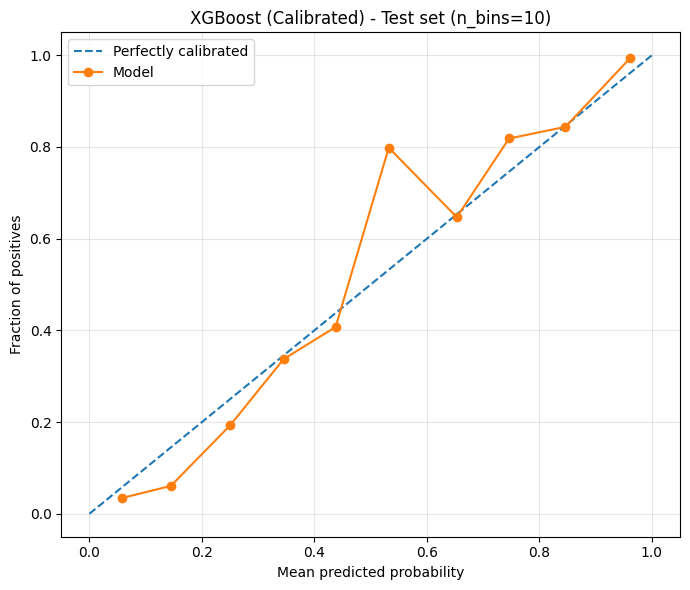

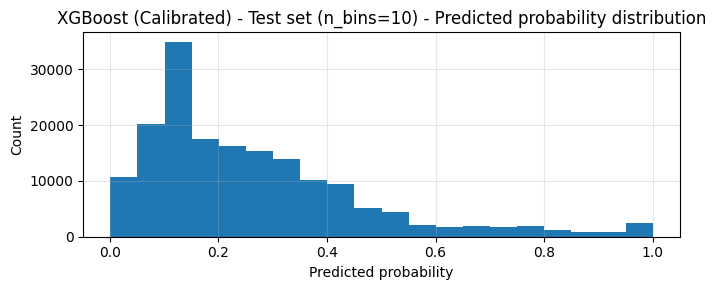

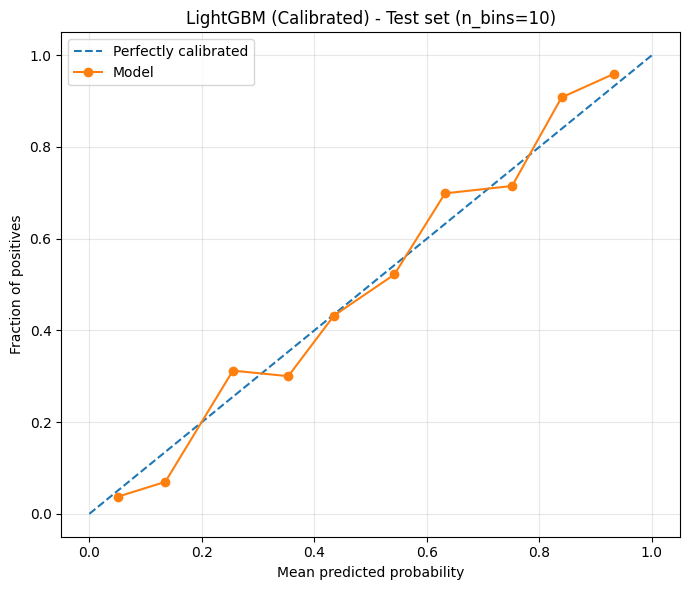

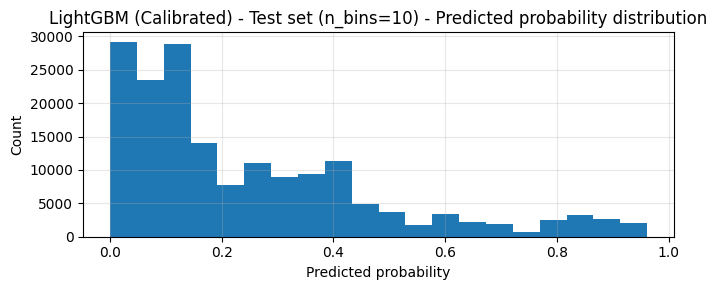

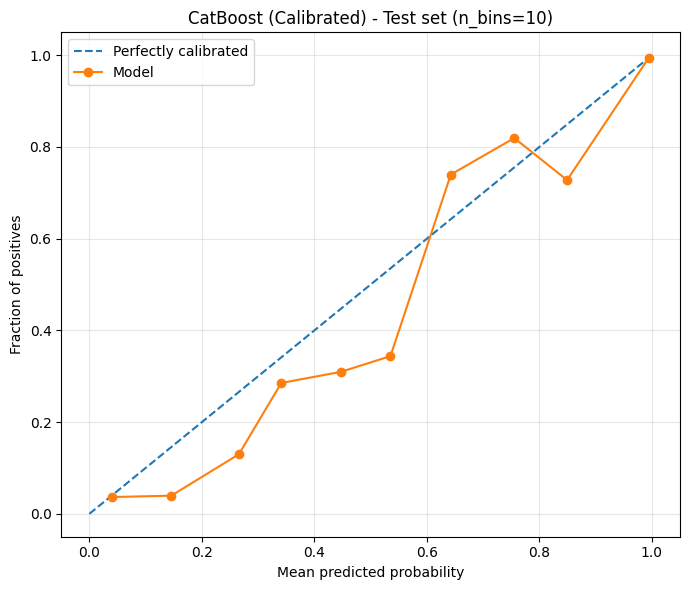

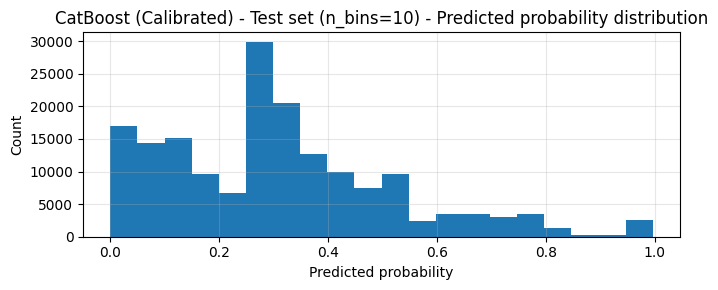

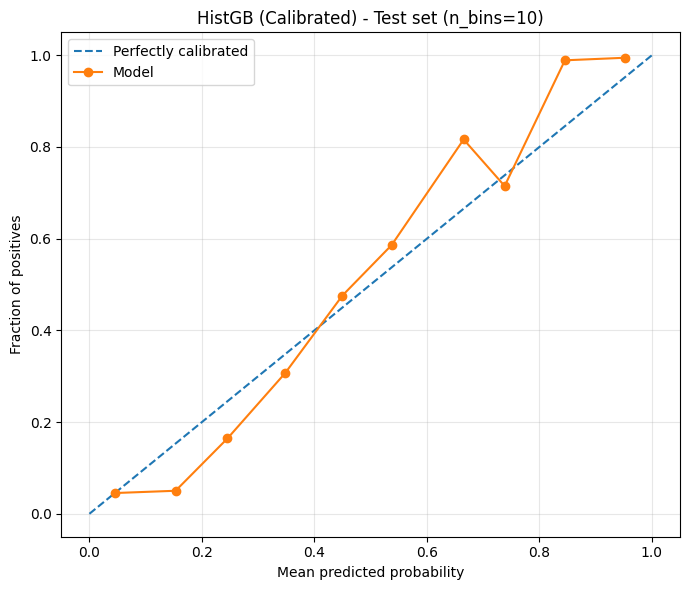

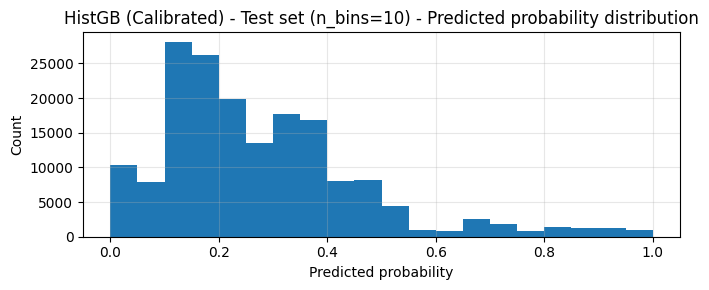

                   model  brier_score  \
0   XGBoost (Calibrated)     0.125038   
1  LightGBM (Calibrated)     0.119501   
2  CatBoost (Calibrated)     0.137720   
3    HistGB (Calibrated)     0.130559   

                                            csv_path  \
0  results\xgboost-calibrated-test-set-n-bins10-c...   
1  results\lightgbm-calibrated-test-set-n-bins10-...   
2  results\catboost-calibrated-test-set-n-bins10-...   
3  results\histgb-calibrated-test-set-n-bins10-ca...   

                               calibration_curve_png  \
0  figs\xgboost-calibrated-test-set-n-bins10-cali...   
1  figs\lightgbm-calibrated-test-set-n-bins10-cal...   
2  figs\catboost-calibrated-test-set-n-bins10-cal...   
3  figs\histgb-calibrated-test-set-n-bins10-calib...   

                                  pred_prob_hist_png  
0  figs\xgboost-calibrated-test-set-n-bins10-pred...  
1  figs\lightgbm-calibrated-test-set-n-bins10-pre...  
2  figs\catboost-calibrated-test-set-n-bins10-pre...  
3  figs\hist

,model,brier_score,csv_path,calibration_curve_png,pred_prob_hist_png
0,XGBoost (Calibrated),0.125038,results\xgboost-calibrated-test-set-n-bins10-c...,figs\xgboost-calibrated-test-set-n-bins10-cali...,figs\xgboost-calibrated-test-set-n-bins10-pred...
1,LightGBM (Calibrated),0.119501,results\lightgbm-calibrated-test-set-n-bins10-...,figs\lightgbm-calibrated-test-set-n-bins10-cal...,figs\lightgbm-calibrated-test-set-n-bins10-pre...
2,CatBoost (Calibrated),0.137720,results\catboost-calibrated-test-set-n-bins10-...,figs\catboost-calibrated-test-set-n-bins10-cal...,figs\catboost-calibrated-test-set-n-bins10-pre...
3,HistGB (Calibrated),0.130559,results\histgb-calibrated-test-set-n-bins10-ca...,figs\histgb-calibrated-test-set-n-bins10-calib...,figs\histgb-calibrated-test-set-n-bins10-pred-...


In [31]:
import os
import re
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.calibration import calibration_curve

figs_dir = "figs"
results_dir = "results"
os.makedirs(figs_dir, exist_ok=True)
os.makedirs(results_dir, exist_ok=True)

def clean_filename(text: str) -> str:
    text = text.lower()
    text = text.replace("(", "").replace(")", "")
    text = text.replace("=", "")
    text = text.replace("_-_", "-")
    text = text.replace(" - ", "-")
    text = text.replace(" ", "-")
    text = re.sub(r"[^a-z0-9\-]", "-", text)
    text = re.sub(r"-+", "-", text)
    return text.strip("-")

def calibration_points(cal_model, X, y, n_bins=10, strategy="uniform"):
    y_prob = cal_model.predict_proba(X)[:, 1]
    y_true = y.to_numpy() if hasattr(y, "to_numpy") else np.asarray(y)
    frac_pos, mean_pred = calibration_curve(y_true, y_prob, n_bins=n_bins, strategy=strategy)
    calib_df = pd.DataFrame({"mean_pred": mean_pred, "frac_pos": frac_pos})
    return calib_df, y_prob

def plot_and_save_calibration(
    calib_df,
    y_prob,
    title,
    figs_dir="figs",
    show_hist=True,
    bins=20,
    show=False,   # default False for loops
):
    safe_title = clean_filename(title)

    # --- Calibration curve ---
    plt.figure(figsize=(7, 6))
    plt.plot([0, 1], [0, 1], linestyle="--", label="Perfectly calibrated")
    plt.plot(calib_df["mean_pred"], calib_df["frac_pos"], marker="o", label="Model")
    plt.xlabel("Mean predicted probability")
    plt.ylabel("Fraction of positives")
    plt.title(title)
    plt.legend()
    plt.grid(True, alpha=0.3)
    plt.tight_layout()

    cal_path = os.path.join(figs_dir, f"{safe_title}-calibration-curve.png")
    plt.savefig(cal_path, dpi=300, bbox_inches="tight")
    if show:
        plt.show()
    else:
        plt.close()

    # --- Histogram (optional) ---
    hist_path = None
    if show_hist and (y_prob is not None):
        plt.figure(figsize=(7, 3))
        plt.hist(y_prob, bins=bins)
        plt.title(f"{title} - Predicted probability distribution")
        plt.xlabel("Predicted probability")
        plt.ylabel("Count")
        plt.grid(True, alpha=0.3)
        plt.tight_layout()

        hist_path = os.path.join(figs_dir, f"{safe_title}-pred-prob-hist.png")
        plt.savefig(hist_path, dpi=300, bbox_inches="tight")
        if show:
            plt.show()
        else:
            plt.close()

    return cal_path, hist_path

# =========================
# RUN FOR ALL MODELS
# =========================

models = {
    "XGBoost (Calibrated)": xgb_cal,
    "LightGBM (Calibrated)": lgbm_cal,
    "CatBoost (Calibrated)": cat_cal,
    "HistGB (Calibrated)": hgb_cal,
}

n_bins = 10
strategy = "uniform"   # try "quantile" too if you want
bins_hist = 20

summary = []

for model_name, model in models.items():
    title = f"{model_name} - Test set (n_bins={n_bins})"

    calib_df, y_prob = calibration_points(model, X_test_clean, y_test, n_bins=n_bins, strategy=strategy)

    # Save calibration points
    safe_title = clean_filename(title)
    csv_path = os.path.join(results_dir, f"{safe_title}-calibration-points-test.csv")
    calib_df.to_csv(csv_path, index=False)

    # Save figures
    cal_path, hist_path = plot_and_save_calibration(
        calib_df=calib_df,
        y_prob=y_prob,
        title=title,
        figs_dir=figs_dir,
        show_hist=True,
        bins=bins_hist,
        show=True
    )

    brier = brier_score_loss(y_test.to_numpy(), y_prob)

    summary.append({
    "model": model_name,
    "brier_score": brier,
    "csv_path": csv_path,
    "calibration_curve_png": cal_path,
    "pred_prob_hist_png": hist_path
})

summary_df = pd.DataFrame(summary)
print(summary_df)
summary_df

Calibration curves saved to figs\calibration-curves-test-set.png


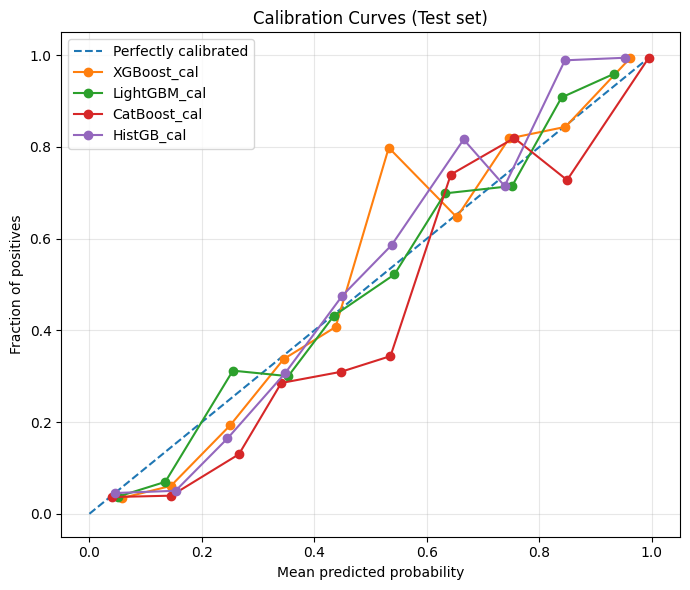

In [32]:
def clean_filename(text: str) -> str:
    text = text.lower()
    text = text.replace("(", "").replace(")", "")
    text = text.replace("=", "")
    text = text.replace("_-_", "-")
    text = text.replace(" - ", "-")
    text = text.replace(" ", "-")
    text = re.sub(r"[^a-z0-9\-]", "-", text)
    text = re.sub(r"-+", "-", text)
    return text.strip("-")

def plot_calibration_multi(models_dict, X, y, n_bins=10, strategy="uniform", title="Calibration Curves"):
    plt.figure(figsize=(7, 6))
    plt.plot([0, 1], [0, 1], linestyle="--", label="Perfectly calibrated")

    for name, model in models_dict.items():
        y_prob = model.predict_proba(X)[:, 1]
        frac_pos, mean_pred = calibration_curve(y, y_prob, n_bins=n_bins, strategy=strategy)
        plt.plot(mean_pred, frac_pos, marker="o", label=name)

    plt.xlabel("Mean predicted probability")
    plt.ylabel("Fraction of positives")
    plt.title(title)
    plt.legend()
    plt.grid(True, alpha=0.3)
    plt.tight_layout()
    plt.savefig(os.path.join(figs_dir, f"{clean_filename(title)}.png"), dpi=300, bbox_inches="tight")  
    print(f"Calibration curves saved to {os.path.join(figs_dir, f'{clean_filename(title)}.png')}") 
    plt.show()

models = {
    "XGBoost_cal": xgb_cal,
    "LightGBM_cal": lgbm_cal,
    "CatBoost_cal": cat_cal,
    "HistGB_cal": hgb_cal,
}

plot_calibration_multi(models, X_test_clean, y_test, n_bins=10, strategy="uniform",
                       title="Calibration Curves (Test set)")

Calibration curves demonstrated that LightGBM and XGBoost were well-calibrated across most probability ranges, closely following the ideal diagonal line. Minor deviations were observed in intermediate probability bins, while high-risk predictions (>0.8) showed strong calibration consistency.

###  Confidence bands and ECE scores

In [33]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.calibration import calibration_curve

def plot_calibration_multi(
    models_dict, X, y,
    n_bins=10, strategy="uniform",
    title="Calibration Curves",
    n_bootstrap=200,
    groups=None,     # if provided => patient-bootstrap bands
    seed=42,
):
    rng = np.random.default_rng(seed)

    y_true = y.to_numpy() if hasattr(y, "to_numpy") else np.asarray(y)
    y_true = np.asarray(y_true).astype(int)

    plt.figure(figsize=(7, 6))
    plt.plot([0, 1], [0, 1], linestyle="--", label="Perfectly calibrated")

    ece_scores = {}

    # patient -> rows map (only if groups is provided)
    pat_to_rows = None
    if groups is not None:
        g = groups.to_numpy() if hasattr(groups, "to_numpy") else np.asarray(groups)
        g = np.asarray(g)
        pats = np.unique(g)
        pat_to_rows = {}
        for i, pid in enumerate(g):
            pat_to_rows.setdefault(pid, []).append(i)

    for name, model in models_dict.items():
        y_prob = model.predict_proba(X)[:, 1]

        # Main calibration curve
        frac_pos, mean_pred = calibration_curve(y_true, y_prob, n_bins=n_bins, strategy=strategy)

        # ECE (uniform bins)
        bin_edges = np.linspace(0.0, 1.0, n_bins + 1)
        bin_ids = np.digitize(y_prob, bin_edges[1:-1], right=False)

        ece = 0.0
        N = len(y_prob)
        for b in range(n_bins):
            m = bin_ids == b
            nb = m.sum()
            if nb == 0:
                continue
            acc = y_true[m].mean()
            conf = y_prob[m].mean()
            ece += (nb / N) * abs(acc - conf)

        ece_scores[name] = float(ece)

        # Bootstrap confidence bands
        boot_curves = []
        for _ in range(n_bootstrap):

            if pat_to_rows is None:
                idx = rng.choice(N, size=N, replace=True)
            else:
                sampled_pats = rng.choice(pats, size=len(pats), replace=True)
                idx = np.concatenate([np.asarray(pat_to_rows[p], dtype=int) for p in sampled_pats])

            y_b = y_true[idx]
            p_b = y_prob[idx]

            # guard: if a bootstrap sample ends up single-class
            if len(np.unique(y_b)) < 2:
                continue

            fp_b, mp_b = calibration_curve(y_b, p_b, n_bins=n_bins, strategy=strategy)

            # sort for interp + ensure enough points
            order = np.argsort(mp_b)
            mp_b, fp_b = mp_b[order], fp_b[order]
            if len(mp_b) < 2:
                continue

            boot_curves.append(np.interp(mean_pred, mp_b, fp_b))

        if len(boot_curves) >= 10:
            boot_curves = np.asarray(boot_curves)
            lower = np.percentile(boot_curves, 2.5, axis=0)
            upper = np.percentile(boot_curves, 97.5, axis=0)
        else:
            lower = upper = None

        line, = plt.plot(mean_pred, frac_pos, marker="o", label=f"{name} (ECE={ece:.3f})")
        if lower is not None:
            plt.fill_between(mean_pred, lower, upper, alpha=0.15, color=line.get_color())

    plt.xlabel("Mean predicted probability")
    plt.ylabel("Fraction of positives")
    plt.title(title)
    plt.legend(fontsize=8)
    plt.grid(True, alpha=0.3)
    plt.tight_layout()

    out_path = os.path.join(figs_dir, f"{clean_filename(title)}.png")
    plt.savefig(out_path, dpi=300, bbox_inches="tight")
    print(f"✅ Calibration curves saved to {out_path}")

    print("\n--- Expected Calibration Error (ECE) ---")
    for name, ece in sorted(ece_scores.items(), key=lambda x: x[1]):
        print(f"  {name}: {ece:.4f}")

    plt.show()
    return ece_scores

✅ Calibration curves saved to figs\calibration-curves-test-set.png

--- Expected Calibration Error (ECE) ---
  LightGBM_cal: 0.0395
  XGBoost_cal: 0.0564
  HistGB_cal: 0.0664
  CatBoost_cal: 0.0892


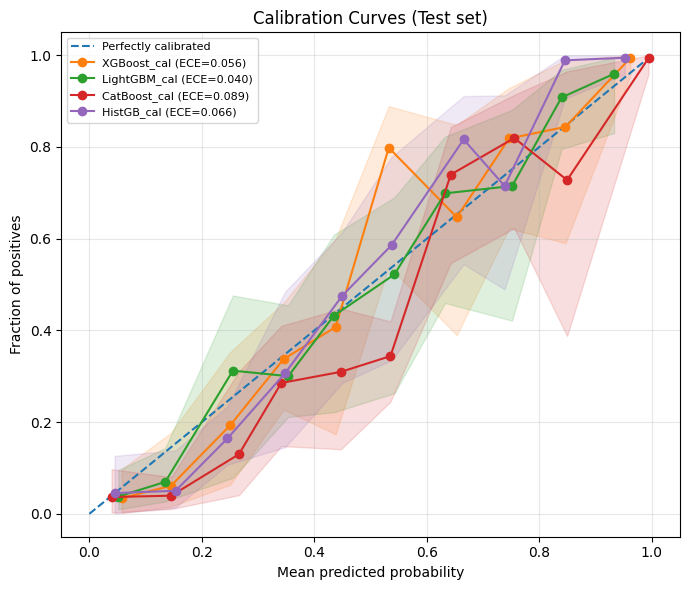

In [34]:
models = {
    "XGBoost_cal": xgb_cal,
    "LightGBM_cal": lgbm_cal,
    "CatBoost_cal": cat_cal,
    "HistGB_cal": hgb_cal,
}

ece_results = plot_calibration_multi(
    models, X_test_clean, y_test,
    n_bins=10,
    strategy="uniform",
    title="Calibration Curves (Test set)",
    n_bootstrap=200,
    groups=g_test,   # patient-bootstrap bands
    seed=42
)

### Baseline model

In [51]:
import os
import joblib
from sklearn.pipeline import Pipeline
from sklearn.impute import SimpleImputer
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import roc_auc_score, average_precision_score

# ---- model ----
baseline_model = Pipeline([
    ("imputer", SimpleImputer(strategy="median")),
    ("lr", LogisticRegression(max_iter=1000, n_jobs=-1))
])

# ---- train ----
baseline_model.fit(X_train_clean, y_train)

# ---- predict ----
y_prob = baseline_model.predict_proba(X_test_clean)[:, 1]

roc = roc_auc_score(y_test, y_prob)
pr  = average_precision_score(y_test, y_prob)

print("Baseline Logistic Regression")
print("ROC-AUC:", roc)
print("PR-AUC:", pr)

# ---- save model ----
models_dir = "models"
os.makedirs(models_dir, exist_ok=True)

joblib.dump(baseline_model, os.path.join(models_dir, "logistic_regression_baseline.pkl"))

print("✅ Baseline model saved to models/logistic_regression_baseline.pkl")

c:\Users\AZhaa\anaconda3\envs\armd\Lib\site-packages\sklearn\linear_model\_logistic.py:1184: FutureWarning: 'n_jobs' has no effect since 1.8 and will be removed in 1.10. You provided 'n_jobs=-1', please leave it unspecified.
  warnings.warn(msg, category=FutureWarning)
c:\Users\AZhaa\anaconda3\envs\armd\Lib\site-packages\sklearn\linear_model\_logistic.py:406: ConvergenceWarning: lbfgs failed to converge after 1000 iteration(s) (status=1):
STOP: TOTAL NO. OF ITERATIONS REACHED LIMIT

Increase the number of iterations to improve the convergence (max_iter=1000).
You might also want to scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Baseline Logistic Regression
ROC-AUC: 0.6258271019211119
PR-AUC: 0.3581137693567128
✅ Baseline model saved to models/logistic_regression_baseline.pkl


In [36]:
import os
import pandas as pd

results_dir = "results"
os.makedirs(results_dir, exist_ok=True)

baseline_threshold = 0.5

baseline_metrics = eval_probs(
    y_test.to_numpy(),
    y_prob,
    threshold=baseline_threshold
)

# Convert to dataframe
baseline_df = pd.DataFrame([baseline_metrics], index=["LogisticRegression_baseline"])

# Save
baseline_path = os.path.join(results_dir, "baseline_logistic_regression_results.csv")
baseline_df.to_csv(baseline_path)

print(baseline_df)
print(f"\n✅ Baseline results saved to {baseline_path}")

                              roc_auc    pr_auc    brier        f1  precision  \
LogisticRegression_baseline  0.625827  0.358114  0.17664  0.298162   0.537623   

                               recall  threshold  
LogisticRegression_baseline  0.206282        0.5  

✅ Baseline results saved to results\baseline_logistic_regression_results.csv


### SHAP

In [9]:
import joblib
import os

models_dir = "models"

xgb_final  = joblib.load(os.path.join(models_dir, "xgb_final.pkl"))
lgbm_final = joblib.load(os.path.join(models_dir, "lgbm_final.pkl"))
cat_final  = joblib.load(os.path.join(models_dir, "cat_final.pkl"))
hgb_final  = joblib.load(os.path.join(models_dir, "hgb_final.pkl"))

print("✅ Final models loaded (use later for SHAP)")

✅ Final models loaded (use later for SHAP)


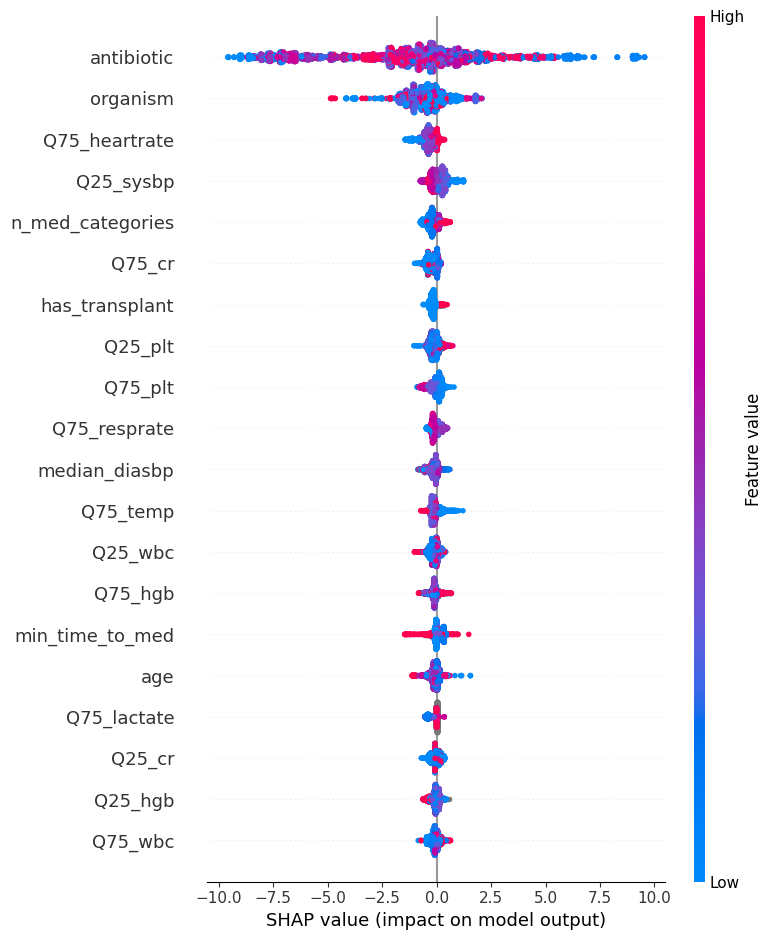

✅ XGBoost SHAP plots saved in /shap


In [12]:
import shap
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import os

shap_dir = "shap"
os.makedirs(shap_dir, exist_ok=True)

# ---- sample to keep it light ----
N_SHAP = 5000
rng = np.random.default_rng(42)
idx = rng.choice(len(X_test_clean), size=min(N_SHAP, len(X_test_clean)), replace=False)
X_shap = X_test_clean.iloc[idx]

# ---- TreeExplainer (best for XGB) ----
explainer_xgb = shap.TreeExplainer(xgb_final)
shap_values_xgb = explainer_xgb.shap_values(X_shap)

# ---- Summary plot (bar) ----
plt.figure()
shap.summary_plot(shap_values_xgb, X_shap, plot_type="bar", show=False)
plt.tight_layout()
plt.savefig(os.path.join(shap_dir, "xgb_shap_summary_bar.png"), dpi=300, bbox_inches="tight")
plt.close()

# ---- Summary plot (beeswarm) ----
plt.figure()
shap.summary_plot(shap_values_xgb, X_shap, show=False)
plt.tight_layout()
plt.savefig(os.path.join(shap_dir, "xgb_shap_summary_beeswarm.png"), dpi=300, bbox_inches="tight")
plt.show()
plt.close()

print("✅ XGBoost SHAP plots saved in /shap")

c:\Users\AZhaa\anaconda3\envs\armd\Lib\site-packages\shap\explainers\_tree.py:620: UserWarning: LightGBM binary classifier with TreeExplainer shap values output has changed to a list of ndarray
  warnings.warn(


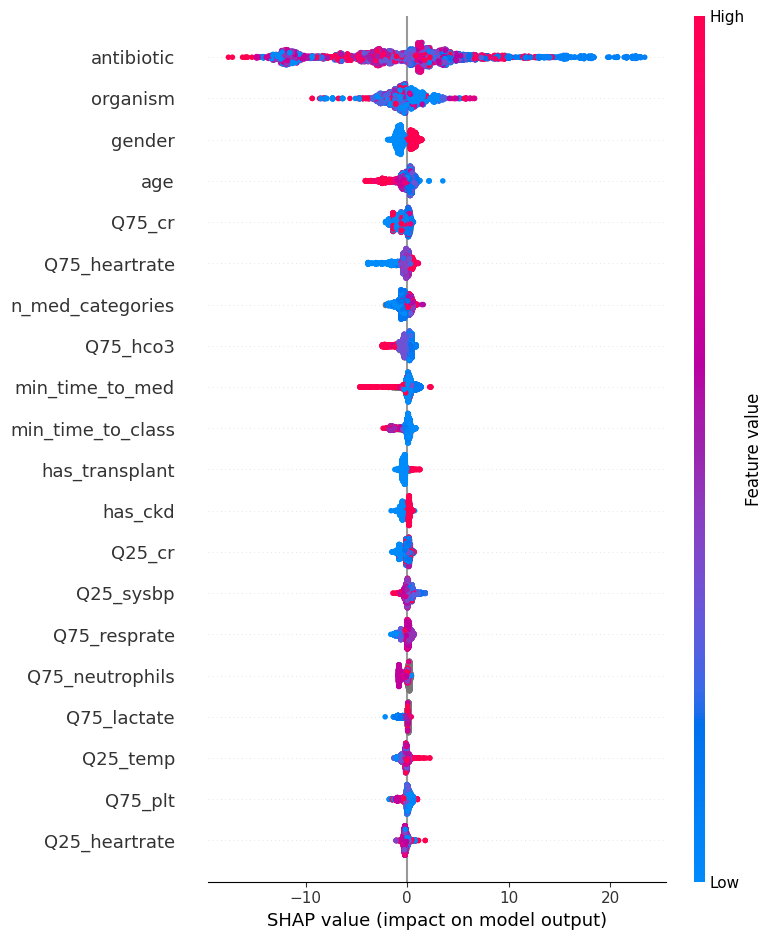

✅ LightGBM SHAP plots saved in /shap


In [13]:
# ---- TreeExplainer (best for LGBM) ----
explainer_lgbm = shap.TreeExplainer(lgbm_final)
shap_values_lgbm = explainer_lgbm.shap_values(X_shap)

# ---- Summary plot (bar) ----
plt.figure()
shap.summary_plot(shap_values_lgbm, X_shap, plot_type="bar", show=False)
plt.tight_layout()
plt.savefig(os.path.join(shap_dir, "lgbm_shap_summary_bar.png"), dpi=300, bbox_inches="tight")
plt.close()

# ---- Summary plot (beeswarm) ----
plt.figure()
shap.summary_plot(shap_values_lgbm, X_shap, show=False)
plt.tight_layout()
plt.savefig(os.path.join(shap_dir, "lgbm_shap_summary_beeswarm.png"), dpi=300, bbox_inches="tight")
plt.show()
plt.close()

print("✅ LightGBM SHAP plots saved in /shap")

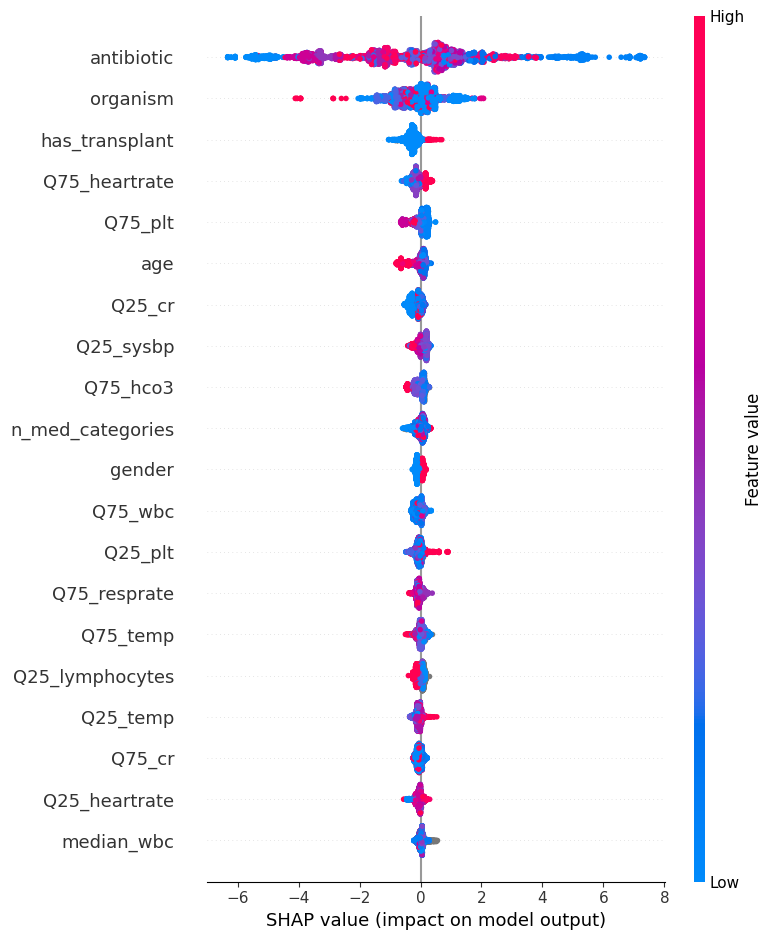

✅ CatBoost SHAP plots saved in /shap


In [14]:
# ---- TreeExplainer (best for CatBoost) ----
explainer_cat = shap.TreeExplainer(cat_final)
shap_values_cat = explainer_cat.shap_values(X_shap)

# ---- Summary plot (bar) ----
plt.figure()
shap.summary_plot(shap_values_cat, X_shap, plot_type="bar", show=False)
plt.tight_layout()
plt.savefig(os.path.join(shap_dir, "catboost_shap_summary_bar.png"), dpi=300, bbox_inches="tight")
plt.close()

# ---- Summary plot (beeswarm) ----
plt.figure()
shap.summary_plot(shap_values_cat, X_shap, show=False)
plt.tight_layout()
plt.savefig(os.path.join(shap_dir, "catboost_shap_summary_beeswarm.png"), dpi=300, bbox_inches="tight")
plt.show()
plt.close()

print("✅ CatBoost SHAP plots saved in /shap")

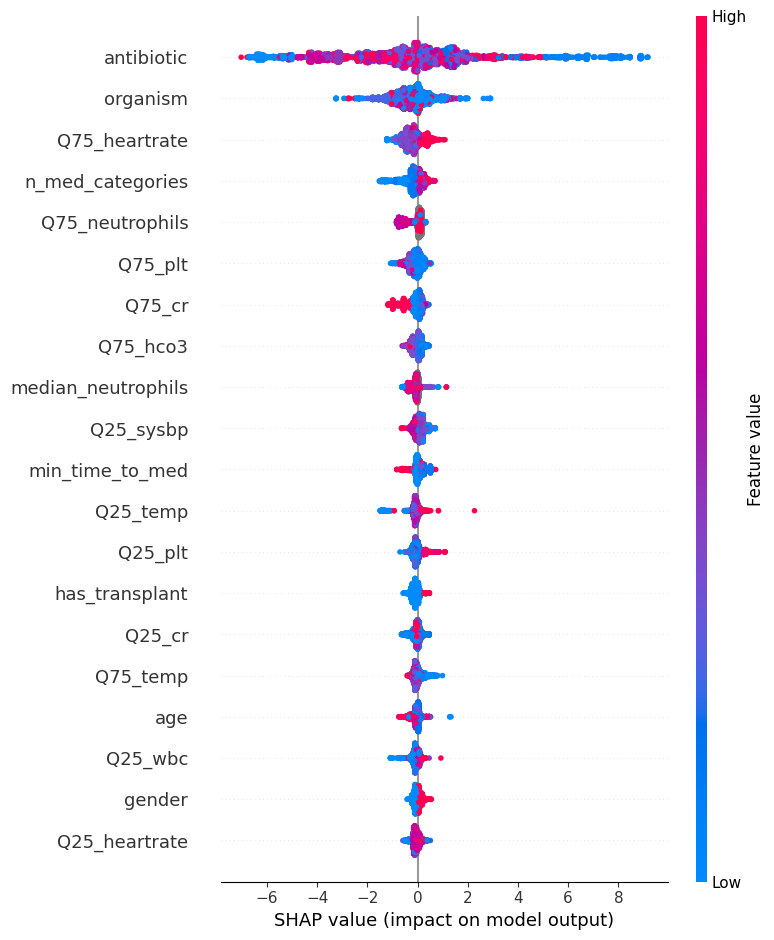

✅ HistGradientBoosting SHAP plots saved in /shap


In [15]:
# ---- TreeExplainer (for HistGradientBoosting) ----
explainer_hgb = shap.TreeExplainer(hgb_final)
shap_values_hgb = explainer_hgb.shap_values(X_shap)

# ---- Summary plot (bar) ----
plt.figure()
shap.summary_plot(shap_values_hgb, X_shap, plot_type="bar", show=False)
plt.tight_layout()
plt.savefig(os.path.join(shap_dir, "histgb_shap_summary_bar.png"), dpi=300, bbox_inches="tight")
plt.close()

# ---- Summary plot (beeswarm) ----
plt.figure()
shap.summary_plot(shap_values_hgb, X_shap, show=False)
plt.tight_layout()
plt.savefig(os.path.join(shap_dir, "histgb_shap_summary_beeswarm.png"), dpi=300, bbox_inches="tight")
plt.show()
plt.close()

print("✅ HistGradientBoosting SHAP plots saved in /shap")

In [16]:
import numpy as np
import pandas as pd
import os

def _to_2d_shap(shap_values):
    """
    Normalize SHAP output to a 2D array: (n_samples, n_features).
    Handles cases where shap returns:
      - list [class0, class1, ...]
      - 3D array (n_samples, n_features, n_classes)
      - already 2D
    """
    # If list (multi-class/binary as list), take class 1 if exists else class 0
    if isinstance(shap_values, list):
        shap_values = shap_values[1] if len(shap_values) > 1 else shap_values[0]

    arr = np.asarray(shap_values)

    # If 3D, pick class 1 if exists else first class
    if arr.ndim == 3:
        class_axis = 2
        k = 1 if arr.shape[class_axis] > 1 else 0
        arr = arr[:, :, k]

    if arr.ndim != 2:
        raise ValueError(f"Unexpected shap_values shape: {arr.shape}")

    return arr

def shap_importance_table(shap_values, X, top_k=30):
    sv = _to_2d_shap(shap_values)
    vals = np.abs(sv).mean(axis=0)
    df = pd.DataFrame({"feature": X.columns, "mean_abs_shap": vals})
    return df.sort_values("mean_abs_shap", ascending=False).head(top_k).reset_index(drop=True)

# ---- importance tables (top 30) ----
imp_xgb  = shap_importance_table(shap_values_xgb,  X_shap, top_k=30)
imp_lgbm = shap_importance_table(shap_values_lgbm, X_shap, top_k=30)
imp_cat  = shap_importance_table(shap_values_cat,  X_shap, top_k=30)
imp_hgb  = shap_importance_table(shap_values_hgb,  X_shap, top_k=30)

print(f"xgb shap importance top30:\n{imp_xgb}\n")
print(f"lgbm shap importance top30:\n{imp_lgbm}\n")
print(f"cat shap importance top30:\n{imp_cat}\n")
print(f"hgb shap importance top30:\n{imp_hgb}\n")

# ---- save csv ----
imp_xgb.to_csv(os.path.join(shap_dir, "xgb_shap_importance_top30.csv"), index=False)
imp_lgbm.to_csv(os.path.join(shap_dir, "lgbm_shap_importance_top30.csv"), index=False)
imp_cat.to_csv(os.path.join(shap_dir, "catboost_shap_importance_top30.csv"), index=False)
imp_hgb.to_csv(os.path.join(shap_dir, "histgb_shap_importance_top30.csv"), index=False)

print("✅ SHAP importance tables saved (XGB/LGBM/CatBoost/HistGB)")

xgb shap importance top30:
             feature  mean_abs_shap
0         antibiotic       2.799537
1           organism       0.696451
2      Q75_heartrate       0.329871
3          Q25_sysbp       0.239491
4   n_med_categories       0.219701
5             Q75_cr       0.213759
6     has_transplant       0.185262
7            Q25_plt       0.184092
8            Q75_plt       0.179212
9       Q75_resprate       0.161107
10     median_diasbp       0.158911
11          Q75_temp       0.154952
12           Q25_wbc       0.151985
13           Q75_hgb       0.148348
14   min_time_to_med       0.145910
15               age       0.142748
16       Q75_lactate       0.141035
17            Q25_cr       0.136742
18           Q25_hgb       0.134004
19           Q75_wbc       0.127584
20          Q75_hco3       0.126309
21           Q75_bun       0.125596
22      median_sysbp       0.124685
23     Q25_heartrate       0.124260
24         median_cr       0.124010
25            Q75_na       0.121116
2

#### feature importance varies across organism–antibiotic pairs

In [9]:
import joblib
import os
import shap
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# =========================================================
# 1) LOAD FINAL LIGHTGBM MODEL
# =========================================================
models_dir = "models"
lgbm_final = joblib.load(os.path.join(models_dir, "lgbm_final.pkl"))
print("✅ LightGBM final model loaded")

# =========================================================
# 2) OUTPUT DIRECTORIES
# =========================================================
shap_dir = "shap_lgbm"
os.makedirs(shap_dir, exist_ok=True)

pair_shap_dir = os.path.join(shap_dir, "pair_analysis")
os.makedirs(pair_shap_dir, exist_ok=True)

pair_importance_dir = os.path.join(pair_shap_dir, "feature_tables")
os.makedirs(pair_importance_dir, exist_ok=True)

# =========================================================
# 3) MAPS
# =========================================================
antibiotic_map = {
    21: "Other",
    10: "Ciprofloxacin",
    14: "Gentamicin",
    16: "Levofloxacin",
    27: "Trimethoprim/Sulfamethoxazole",
    2:  "Ampicillin",
    20: "Nitrofurantoin",
    24: "Piperacillin/Tazobactam",
    5:  "Cefazolin",
    9:  "Ceftriaxone",
    18: "Meropenem",
    8:  "Ceftazidime",
    25: "Tetracycline",
    0:  "Amikacin",
    1:  "Amoxicillin/Clavulanic Acid",
    26: "Tobramycin",
    12: "Ertapenem",
    7:  "Cefoxitin",
    6:  "Cefepime",
    28: "Vancomycin",
    23: "Penicillin",
    4:  "Aztreonam",
    3:  "Ampicillin/Sulbactam",
    11: "Clindamycin",
    13: "Erythromycin",
    17: "Linezolid",
    22: "Oxacillin",
    19: "Moxifloxacin",
    15: "Imipenem",
}

organism_map = {
    7:  "ESCHERICHIA COLI",
    12: "OTHER",
    9:  "KLEBSIELLA PNEUMONIAE",
    18: "STAPHYLOCOCCUS AUREUS",
    13: "PROTEUS MIRABILIS",
    6:  "ENTEROCOCCUS SPECIES",
    15: "PSEUDOMONAS AERUGINOSA",
    4:  "ENTEROBACTER CLOACAE COMPLEX",
    11: "MUCOID PSEUDOMONAS AERUGINOSA",
    3:  "COAG NEGATIVE STAPHYLOCOCCUS",
    0:  "ACHROMOBACTER XYLOSOXIDANS",
    17: "STAPH AUREUS {MRSA}",
    8:  "KLEBSIELLA OXYTOCA",
    19: "STREPTOCOCCUS AGALACTIAE (GROUP B)",
    2:  "CITROBACTER KOSERI",
    1:  "CITROBACTER FREUNDII COMPLEX",
    16: "SERRATIA MARCESCENS",
    14: "PROVIDENCIA RETTGERI",
    10: "MORGANELLA MORGANII",
    5:  "ENTEROCOCCUS FAECALIS",
    20: "ZZZENTEROBACTER AEROGENES",
}

# =========================================================
# 4) CHECK REQUIRED COLUMNS
# =========================================================
required_cols_test = ["organism", "antibiotic"]
missing_test = [c for c in required_cols_test if c not in X_test_clean.columns]
if missing_test:
    raise ValueError(f"❌ X_test_clean is missing required columns: {missing_test}")

required_cols_full = ["organism", "antibiotic"]
missing_full = [c for c in required_cols_full if c not in df.columns]
if missing_full:
    raise ValueError(f"❌ Full merged df is missing required columns: {missing_full}")

# =========================================================
# 5) HELPER FUNCTIONS
# =========================================================
def make_safe_filename(text: str) -> str:
    text = str(text)
    replacements = {
        " ": "_",
        "/": "_",
        "\\": "_",
        "{": "",
        "}": "",
        "(": "",
        ")": "",
        "[": "",
        "]": "",
        ":": "",
        ";": "",
        ",": "",
        ".": "",
        "'": "",
        '"': "",
        "|": "_",
        "?": "",
        "*": "",
        "<": "",
        ">": "",
        "+": "_plus_",
    }
    for old, new in replacements.items():
        text = text.replace(old, new)
    return text

def normalize_pair_columns(df_in, organism_col="organism", antibiotic_col="antibiotic"):
    out = df_in[[organism_col, antibiotic_col]].copy()
    out[organism_col] = pd.to_numeric(out[organism_col], errors="coerce")
    out[antibiotic_col] = pd.to_numeric(out[antibiotic_col], errors="coerce")
    out = out.dropna(subset=[organism_col, antibiotic_col]).copy()
    out[organism_col] = out[organism_col].astype(int)
    out[antibiotic_col] = out[antibiotic_col].astype(int)
    return out

# =========================================================
# 6) GLOBAL SHAP ON TEST SAMPLE
# =========================================================
N_SHAP = 5000
rng = np.random.default_rng(42)

idx = rng.choice(len(X_test_clean), size=min(N_SHAP, len(X_test_clean)), replace=False)
X_shap = X_test_clean.iloc[idx].copy()

explainer_lgbm = shap.TreeExplainer(lgbm_final)
shap_values_lgbm = explainer_lgbm.shap_values(X_shap)

# for binary classification, some LightGBM SHAP outputs may return a list
if isinstance(shap_values_lgbm, list):
    if len(shap_values_lgbm) == 2:
        shap_values_lgbm_plot = shap_values_lgbm[1]
    else:
        shap_values_lgbm_plot = shap_values_lgbm[0]
else:
    shap_values_lgbm_plot = shap_values_lgbm

plt.figure()
shap.summary_plot(shap_values_lgbm_plot, X_shap, plot_type="bar", show=False)
plt.tight_layout()
plt.savefig(os.path.join(shap_dir, "lgbm_shap_summary_bar.png"), dpi=300, bbox_inches="tight")
plt.close()

plt.figure()
shap.summary_plot(shap_values_lgbm_plot, X_shap, show=False)
plt.tight_layout()
plt.savefig(os.path.join(shap_dir, "lgbm_shap_summary_beeswarm.png"), dpi=300, bbox_inches="tight")
plt.close()

print("✅ Global LightGBM SHAP plots saved")

# =========================================================
# 7) TOP PAIRS FROM FULL MERGED DATASET
# =========================================================
df_full_pairs = normalize_pair_columns(df, organism_col="organism", antibiotic_col="antibiotic")

full_pair_counts = (
    df_full_pairs
    .groupby(["organism", "antibiotic"])
    .size()
    .reset_index(name="count_full")
    .sort_values(by="count_full", ascending=False)
    .reset_index(drop=True)
)

full_pair_counts["organism_name"] = full_pair_counts["organism"].map(organism_map)
full_pair_counts["antibiotic_name"] = full_pair_counts["antibiotic"].map(antibiotic_map)

full_pair_counts["organism_name"] = full_pair_counts["organism_name"].fillna(
    full_pair_counts["organism"].apply(lambda x: f"Unknown_organism_{x}")
)
full_pair_counts["antibiotic_name"] = full_pair_counts["antibiotic_name"].fillna(
    full_pair_counts["antibiotic"].apply(lambda x: f"Unknown_antibiotic_{x}")
)

full_pair_counts.to_csv(
    os.path.join(pair_shap_dir, "all_pair_counts_full_dataset_named.csv"),
    index=False
)

TOP_N = 10
top_pairs_full = full_pair_counts.head(TOP_N).copy()

print("\n✅ Top pairs from FULL dataset:")
print(top_pairs_full[["organism", "organism_name", "antibiotic", "antibiotic_name", "count_full"]])

top_pairs_full.to_csv(
    os.path.join(pair_shap_dir, f"top_{TOP_N}_pairs_from_full_dataset.csv"),
    index=False
)

# =========================================================
# 8) TEST-SET COUNTS FOR THE SAME PAIRS
# =========================================================
df_test_pairs = normalize_pair_columns(X_test_clean, organism_col="organism", antibiotic_col="antibiotic")

test_pair_counts = (
    df_test_pairs
    .groupby(["organism", "antibiotic"])
    .size()
    .reset_index(name="count_test")
)

top_pairs_eval = top_pairs_full.merge(
    test_pair_counts,
    on=["organism", "antibiotic"],
    how="left"
)

top_pairs_eval["count_test"] = top_pairs_eval["count_test"].fillna(0).astype(int)

top_pairs_eval.to_csv(
    os.path.join(pair_shap_dir, f"top_{TOP_N}_pairs_full_with_test_counts.csv"),
    index=False
)

print("\n✅ Top full-data pairs with test-set availability:")
print(top_pairs_eval[[
    "organism_name", "antibiotic_name", "count_full", "count_test"
]])

# =========================================================
# 9) PAIR-SPECIFIC SHAP ON TEST SET ONLY
# =========================================================
MIN_PAIR_SIZE = 100
MAX_PAIR_SAMPLE = 2000

pair_summary_rows = []

for _, row in top_pairs_eval.iterrows():
    org_id = int(row["organism"])
    abx_id = int(row["antibiotic"])
    org_name = row["organism_name"]
    abx_name = row["antibiotic_name"]
    count_full = int(row["count_full"])
    count_test = int(row["count_test"])

    if count_test < MIN_PAIR_SIZE:
        print(f"⚠ Skipping {org_name} + {abx_name} | full={count_full}, test={count_test} (< {MIN_PAIR_SIZE})")
        continue

    subset_idx = (
        (pd.to_numeric(X_test_clean["organism"], errors="coerce").round().astype("Int64") == org_id) &
        (pd.to_numeric(X_test_clean["antibiotic"], errors="coerce").round().astype("Int64") == abx_id)
    )

    X_subset = X_test_clean.loc[subset_idx].copy()

    original_n = len(X_subset)
    if original_n < MIN_PAIR_SIZE:
        print(f"⚠ Skipping {org_name} + {abx_name} after subset build (n={original_n})")
        continue

    if original_n > MAX_PAIR_SAMPLE:
        X_subset = X_subset.sample(n=MAX_PAIR_SAMPLE, random_state=42)

    shap_values_subset = explainer_lgbm.shap_values(X_subset)

    if isinstance(shap_values_subset, list):
        if len(shap_values_subset) == 2:
            shap_values_subset_plot = shap_values_subset[1]
        else:
            shap_values_subset_plot = shap_values_subset[0]
    else:
        shap_values_subset_plot = shap_values_subset

    safe_name = make_safe_filename(f"{org_name}_{abx_name}")

    # Beeswarm
    plt.figure()
    shap.summary_plot(shap_values_subset_plot, X_subset, show=False)
    plt.title(f"{org_name} + {abx_name}")
    plt.tight_layout()
    plt.savefig(
        os.path.join(pair_shap_dir, f"{safe_name}_beeswarm.png"),
        dpi=300,
        bbox_inches="tight"
    )
    plt.close()

    # Bar
    plt.figure()
    shap.summary_plot(shap_values_subset_plot, X_subset, plot_type="bar", show=False)
    plt.title(f"{org_name} + {abx_name}")
    plt.tight_layout()
    plt.savefig(
        os.path.join(pair_shap_dir, f"{safe_name}_bar.png"),
        dpi=300,
        bbox_inches="tight"
    )
    plt.close()

    # Mean |SHAP|
    mean_abs_shap = np.abs(shap_values_subset_plot).mean(axis=0)

    importance_df = pd.DataFrame({
        "feature": X_subset.columns,
        "mean_abs_shap": mean_abs_shap
    }).sort_values(by="mean_abs_shap", ascending=False).reset_index(drop=True)

    importance_df.to_csv(
        os.path.join(pair_importance_dir, f"{safe_name}_feature_importance.csv"),
        index=False
    )

    summary_row = {
        "organism_id": org_id,
        "organism_name": org_name,
        "antibiotic_id": abx_id,
        "antibiotic_name": abx_name,
        "pair_count_full_dataset": count_full,
        "pair_count_test_set": count_test,
        "shap_sample_n": len(X_subset),
    }

    top_k = 10
    for i, (_, feat_row) in enumerate(importance_df.head(top_k).iterrows(), start=1):
        summary_row[f"top_feature_{i}"] = feat_row["feature"]
        summary_row[f"top_feature_{i}_mean_abs_shap"] = feat_row["mean_abs_shap"]

    pair_summary_rows.append(summary_row)

    print(f"✅ Done: {org_name} + {abx_name} | full={count_full}, test={count_test}, used={len(X_subset)}")

# =========================================================
# 10) SAVE COMBINED SUMMARY TABLE
# =========================================================
if pair_summary_rows:
    pair_summary_df = pd.DataFrame(pair_summary_rows)
    pair_summary_df.to_csv(
        os.path.join(pair_shap_dir, "pair_specific_shap_top10_summary_lgbm.csv"),
        index=False
    )
    print("✅ Pair-specific LightGBM SHAP summary table saved")
else:
    print("⚠ No pair-specific LightGBM SHAP results were saved")

print("✅ Pair-specific LightGBM SHAP analysis completed")

✅ LightGBM final model loaded


c:\Users\AZhaa\anaconda3\envs\armd\Lib\site-packages\shap\explainers\_tree.py:620: UserWarning: LightGBM binary classifier with TreeExplainer shap values output has changed to a list of ndarray
  warnings.warn(


✅ Global LightGBM SHAP plots saved

✅ Top pairs from FULL dataset:
   organism        organism_name  antibiotic                antibiotic_name  \
0        16  SERRATIA MARCESCENS          21                          Other   
1         7     ESCHERICHIA COLI          27  Trimethoprim/Sulfamethoxazole   
2         7     ESCHERICHIA COLI          10                  Ciprofloxacin   
3         7     ESCHERICHIA COLI          14                     Gentamicin   
4         7     ESCHERICHIA COLI           2                     Ampicillin   
5         7     ESCHERICHIA COLI          24        Piperacillin/Tazobactam   
6         7     ESCHERICHIA COLI          16                   Levofloxacin   
7         7     ESCHERICHIA COLI           5                      Cefazolin   
8         7     ESCHERICHIA COLI           9                    Ceftriaxone   
9         7     ESCHERICHIA COLI          18                      Meropenem   

   count_full  
0       38542  
1       28710  
2       28632  

c:\Users\AZhaa\anaconda3\envs\armd\Lib\site-packages\shap\explainers\_tree.py:620: UserWarning: LightGBM binary classifier with TreeExplainer shap values output has changed to a list of ndarray
  warnings.warn(


✅ Done: SERRATIA MARCESCENS + Other | full=38542, test=186, used=186


c:\Users\AZhaa\anaconda3\envs\armd\Lib\site-packages\shap\explainers\_tree.py:620: UserWarning: LightGBM binary classifier with TreeExplainer shap values output has changed to a list of ndarray
  warnings.warn(


✅ Done: ESCHERICHIA COLI + Trimethoprim/Sulfamethoxazole | full=28710, test=5044, used=2000


c:\Users\AZhaa\anaconda3\envs\armd\Lib\site-packages\shap\explainers\_tree.py:620: UserWarning: LightGBM binary classifier with TreeExplainer shap values output has changed to a list of ndarray
  warnings.warn(


✅ Done: ESCHERICHIA COLI + Ciprofloxacin | full=28632, test=5044, used=2000


c:\Users\AZhaa\anaconda3\envs\armd\Lib\site-packages\shap\explainers\_tree.py:620: UserWarning: LightGBM binary classifier with TreeExplainer shap values output has changed to a list of ndarray
  warnings.warn(


✅ Done: ESCHERICHIA COLI + Gentamicin | full=28575, test=4930, used=2000


c:\Users\AZhaa\anaconda3\envs\armd\Lib\site-packages\shap\explainers\_tree.py:620: UserWarning: LightGBM binary classifier with TreeExplainer shap values output has changed to a list of ndarray
  warnings.warn(


✅ Done: ESCHERICHIA COLI + Ampicillin | full=28306, test=5040, used=2000


c:\Users\AZhaa\anaconda3\envs\armd\Lib\site-packages\shap\explainers\_tree.py:620: UserWarning: LightGBM binary classifier with TreeExplainer shap values output has changed to a list of ndarray
  warnings.warn(


✅ Done: ESCHERICHIA COLI + Piperacillin/Tazobactam | full=27055, test=4807, used=2000


c:\Users\AZhaa\anaconda3\envs\armd\Lib\site-packages\shap\explainers\_tree.py:620: UserWarning: LightGBM binary classifier with TreeExplainer shap values output has changed to a list of ndarray
  warnings.warn(


✅ Done: ESCHERICHIA COLI + Levofloxacin | full=26406, test=4315, used=2000


c:\Users\AZhaa\anaconda3\envs\armd\Lib\site-packages\shap\explainers\_tree.py:620: UserWarning: LightGBM binary classifier with TreeExplainer shap values output has changed to a list of ndarray
  warnings.warn(


✅ Done: ESCHERICHIA COLI + Cefazolin | full=26322, test=4982, used=2000


c:\Users\AZhaa\anaconda3\envs\armd\Lib\site-packages\shap\explainers\_tree.py:620: UserWarning: LightGBM binary classifier with TreeExplainer shap values output has changed to a list of ndarray
  warnings.warn(


✅ Done: ESCHERICHIA COLI + Ceftriaxone | full=25852, test=4688, used=2000


c:\Users\AZhaa\anaconda3\envs\armd\Lib\site-packages\shap\explainers\_tree.py:620: UserWarning: LightGBM binary classifier with TreeExplainer shap values output has changed to a list of ndarray
  warnings.warn(


✅ Done: ESCHERICHIA COLI + Meropenem | full=25182, test=4559, used=2000
✅ Pair-specific LightGBM SHAP summary table saved
✅ Pair-specific LightGBM SHAP analysis completed


### ROC-AUC and DeLong

In [52]:
import joblib
import os

# -------------------------------
# 1) Load models
# -------------------------------
models_dir = "models"

xgb_final  = joblib.load(os.path.join(models_dir, "xgb_final.pkl"))
lgbm_final = joblib.load(os.path.join(models_dir, "lgbm_final.pkl"))
cat_final  = joblib.load(os.path.join(models_dir, "cat_final.pkl"))
hgb_final  = joblib.load(os.path.join(models_dir, "hgb_final.pkl"))

# baseline (Pipeline: imputer + logistic regression)
baseline_path = os.path.join(models_dir, "logistic_regression_baseline.pkl")
baseline_model = joblib.load(baseline_path)

print("✅ Final models + baseline loaded")

✅ Final models + baseline loaded


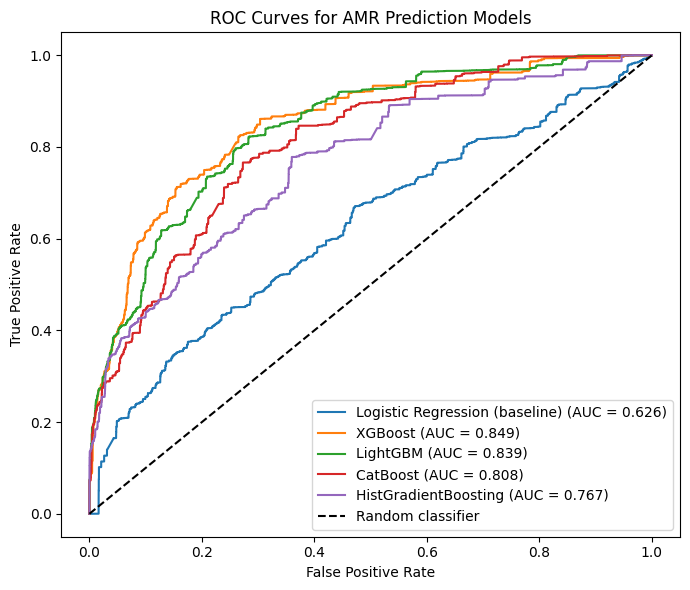

✅ ROC saved to figs/roc_curves_models_with_baseline.png


In [53]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve, roc_auc_score

# -------------------------------
# Helper: get probabilities safely
# -------------------------------
def get_pos_proba(model, X):
    # preferred
    if hasattr(model, "predict_proba"):
        return model.predict_proba(X)[:, 1]
    # fallback (rare): use decision_function and squash
    if hasattr(model, "decision_function"):
        scores = model.decision_function(X)
        return 1 / (1 + np.exp(-scores))
    raise AttributeError(f"Model {model.__class__.__name__} has neither predict_proba nor decision_function.")

# -------------------------------
# 2) ROC plot
# -------------------------------
models = {
    "Logistic Regression (baseline)": baseline_model,
    "XGBoost": xgb_final,
    "LightGBM": lgbm_final,
    "CatBoost": cat_final,
    "HistGradientBoosting": hgb_final,
}

plt.figure(figsize=(7, 6))

for name, model in models.items():
    y_prob = get_pos_proba(model, X_test_clean)
    fpr, tpr, _ = roc_curve(y_test, y_prob)
    auc = roc_auc_score(y_test, y_prob)
    plt.plot(fpr, tpr, label=f"{name} (AUC = {auc:.3f})")

# random classifier line
plt.plot([0, 1], [0, 1], "k--", label="Random classifier")

plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("ROC Curves for AMR Prediction Models")
plt.legend()
plt.tight_layout()

# save figure
os.makedirs("figs", exist_ok=True)
plt.savefig("figs/roc_curves_models_with_baseline.png", dpi=300, bbox_inches="tight")

plt.show()
print("✅ ROC saved to figs/roc_curves_models_with_baseline.png")

In [31]:
import numpy as np
import math
from scipy.stats import norm

def compute_midrank(x):
    """Computes midranks."""
    J = np.argsort(x)
    Z = x[J]
    N = len(x)
    T = np.zeros(N, dtype=float)
    i = 0
    while i < N:
        j = i
        while j < N and Z[j] == Z[i]:
            j += 1
        T[i:j] = 0.5 * (i + j - 1)
        i = j
    T2 = np.empty(N, dtype=float)
    T2[J] = T + 1
    return T2


def fast_delong(predictions_sorted_transposed, label_1_count):
    """Fast DeLong implementation."""
    m = label_1_count
    n = predictions_sorted_transposed.shape[1] - m

    positive_examples = predictions_sorted_transposed[:, :m]
    negative_examples = predictions_sorted_transposed[:, m:]

    k = predictions_sorted_transposed.shape[0]

    tx = np.empty([k, m])
    ty = np.empty([k, n])
    tz = np.empty([k, m + n])

    for r in range(k):
        tx[r] = compute_midrank(positive_examples[r])
        ty[r] = compute_midrank(negative_examples[r])
        tz[r] = compute_midrank(predictions_sorted_transposed[r])

    aucs = tz[:, :m].sum(axis=1) / m / n - (m + 1.0) / (2.0 * n)

    v01 = (tz[:, :m] - tx) / n
    v10 = 1.0 - (tz[:, m:] - ty) / m

    sx = np.cov(v01)
    sy = np.cov(v10)

    delongcov = sx / m + sy / n
    return aucs, delongcov


def calc_pvalue(aucs, sigma):
    """Calculate p-value from AUCs and covariance matrix."""
    l = np.array([[1, -1]])
    # Extract the scalar value from the difference array
    auc_diff = np.abs(np.diff(aucs))[0]  # Get the first (and only) element
    z = auc_diff / np.sqrt(np.dot(np.dot(l, sigma), l.T).item())
    return float(2 * norm.sf(z))  # z is now a scalar


def delong_roc_test(y_true, pred1, pred2):
    """Performs DeLong test to compare two ROC curves."""
    # Convert to numpy arrays if they're pandas Series
    if hasattr(y_true, 'to_numpy'):
        y_true = y_true.to_numpy()
    if hasattr(pred1, 'to_numpy'):
        pred1 = pred1.to_numpy()
    if hasattr(pred2, 'to_numpy'):
        pred2 = pred2.to_numpy()
    
    order = np.argsort(-y_true)
    y_true = y_true[order]

    preds = np.vstack((pred1, pred2))[:, order]
    label_1_count = int(np.sum(y_true))

    aucs, covariance = fast_delong(preds, label_1_count)

    return calc_pvalue(aucs, covariance)


In [55]:
import os
import pandas as pd
from sklearn.metrics import roc_auc_score

# -----------------------------
# Predicted probabilities
# -----------------------------
p_base = baseline_model.predict_proba(X_test_clean)[:, 1]

p_xgb  = xgb_final.predict_proba(X_test_clean)[:, 1]
p_lgbm = lgbm_final.predict_proba(X_test_clean)[:, 1]
p_cat  = cat_final.predict_proba(X_test_clean)[:, 1]
p_hgb  = hgb_final.predict_proba(X_test_clean)[:, 1]

# -----------------------------
# Compute AUC
# -----------------------------
auc_base = roc_auc_score(y_test, p_base)
auc_xgb  = roc_auc_score(y_test, p_xgb)
auc_lgbm = roc_auc_score(y_test, p_lgbm)
auc_cat  = roc_auc_score(y_test, p_cat)
auc_hgb  = roc_auc_score(y_test, p_hgb)

print("AUC BASE:", auc_base)
print("AUC XGB :", auc_xgb)
print("AUC LGBM:", auc_lgbm)
print("AUC CAT :", auc_cat)
print("AUC HGB :", auc_hgb)

# -----------------------------
# DeLong tests
#   NOTE: delong_roc_test(y_true, preds_A, preds_B)
# -----------------------------
# --- comparisons vs BASELINE (recommended for reviewer) ---
p_xgb_vs_base  = delong_roc_test(y_test, p_xgb,  p_base)
p_lgbm_vs_base = delong_roc_test(y_test, p_lgbm, p_base)
p_cat_vs_base  = delong_roc_test(y_test, p_cat,  p_base)
p_hgb_vs_base  = delong_roc_test(y_test, p_hgb,  p_base)

print("\nDeLong p-values (vs Baseline)")
print("XGB  vs BASE:", p_xgb_vs_base)
print("LGBM vs BASE:", p_lgbm_vs_base)
print("CAT  vs BASE:", p_cat_vs_base)
print("HGB  vs BASE:", p_hgb_vs_base)

# --- comparisons vs XGBoost (kept from your original) ---
p_lgbm_vs_xgb = delong_roc_test(y_test, p_xgb, p_lgbm)
p_cat_vs_xgb  = delong_roc_test(y_test, p_xgb, p_cat)
p_hgb_vs_xgb  = delong_roc_test(y_test, p_xgb, p_hgb)

print("\nDeLong p-values (vs XGBoost)")
print("XGB vs LGBM:", p_lgbm_vs_xgb)
print("XGB vs CAT :", p_cat_vs_xgb)
print("XGB vs HGB :", p_hgb_vs_xgb)

# -----------------------------
# Build results table
# -----------------------------
auc_results = pd.DataFrame({
    "Model": [
        "LogisticRegression_baseline",
        "XGBoost",
        "LightGBM",
        "CatBoost",
        "HistGradientBoosting",
    ],
    "ROC_AUC": [auc_base, auc_xgb, auc_lgbm, auc_cat, auc_hgb]
})

delong_results = pd.DataFrame({
    "Comparison": [
        "XGBoost vs LogisticRegression_baseline",
        "LightGBM vs LogisticRegression_baseline",
        "CatBoost vs LogisticRegression_baseline",
        "HistGradientBoosting vs LogisticRegression_baseline",
        "XGBoost vs LightGBM",
        "XGBoost vs CatBoost",
        "XGBoost vs HistGradientBoosting",
    ],
    "p_value": [
        p_xgb_vs_base,
        p_lgbm_vs_base,
        p_cat_vs_base,
        p_hgb_vs_base,
        p_lgbm_vs_xgb,
        p_cat_vs_xgb,
        p_hgb_vs_xgb,
    ]
})

# -----------------------------
# Save results
# -----------------------------
os.makedirs("results", exist_ok=True)

auc_results.to_csv("results/auc_results_with_baseline.csv", index=False)
delong_results.to_csv("results/delong_auc_comparison_with_baseline.csv", index=False)

print("\n✅ Results saved to /results/")
print(" - results/auc_results_with_baseline.csv")
print(" - results/delong_auc_comparison_with_baseline.csv")

AUC BASE: 0.6258271019211119
AUC XGB : 0.8486455161071209
AUC LGBM: 0.8390837800276842
AUC CAT : 0.8075821242480266
AUC HGB : 0.7674034534813163

DeLong p-values (vs Baseline)
XGB  vs BASE: 0.0
LGBM vs BASE: 0.0
CAT  vs BASE: 0.0
HGB  vs BASE: 0.0

DeLong p-values (vs XGBoost)
XGB vs LGBM: 3.762865506634743e-66
XGB vs CAT : 0.0
XGB vs HGB : 0.0

✅ Results saved to /results/
 - results/auc_results_with_baseline.csv
 - results/delong_auc_comparison_with_baseline.csv


### McNemar

In [56]:
import os
import numpy as np
import pandas as pd
from statsmodels.stats.contingency_tables import mcnemar

# -----------------------------
# predicted probabilities
# -----------------------------
p_base = baseline_model.predict_proba(X_test_clean)[:, 1]

p_xgb  = xgb_final.predict_proba(X_test_clean)[:, 1]
p_lgbm = lgbm_final.predict_proba(X_test_clean)[:, 1]
p_cat  = cat_final.predict_proba(X_test_clean)[:, 1]
p_hgb  = hgb_final.predict_proba(X_test_clean)[:, 1]

# -----------------------------
# threshold (choose one)
# -----------------------------
threshold = 0.5

# binary predictions
y_base = (p_base >= threshold).astype(int)

y_xgb  = (p_xgb  >= threshold).astype(int)
y_lgbm = (p_lgbm >= threshold).astype(int)
y_cat  = (p_cat  >= threshold).astype(int)
y_hgb  = (p_hgb  >= threshold).astype(int)

y_true = y_test.to_numpy()

# -----------------------------
# function to compute McNemar
# -----------------------------
def mcnemar_test(y_true, pred1, pred2, exact=False, correction=True):
    # a = both correct, b = pred1 correct pred2 wrong
    # c = pred1 wrong pred2 correct, d = both wrong
    a = np.sum((pred1 == y_true) & (pred2 == y_true))
    b = np.sum((pred1 == y_true) & (pred2 != y_true))
    c = np.sum((pred1 != y_true) & (pred2 == y_true))
    d = np.sum((pred1 != y_true) & (pred2 != y_true))

    table = [[a, b],
             [c, d]]

    res = mcnemar(table, exact=exact, correction=correction)
    return res.statistic, res.pvalue, table

# -----------------------------
# run tests
# -----------------------------
comparisons = [
    # --- vs baseline (recommended) ---
    ("XGBoost vs LogisticRegression_baseline", y_xgb,  y_base),
    ("LightGBM vs LogisticRegression_baseline", y_lgbm, y_base),
    ("CatBoost vs LogisticRegression_baseline", y_cat,  y_base),
    ("HistGradientBoosting vs LogisticRegression_baseline", y_hgb, y_base),

    # --- vs XGBoost (kept from your original) ---
    ("XGBoost vs LightGBM", y_xgb, y_lgbm),
    ("XGBoost vs CatBoost", y_xgb, y_cat),
    ("XGBoost vs HistGradientBoosting", y_xgb, y_hgb),
]

rows = []
for label, pred1, pred2 in comparisons:
    stat, pval, table = mcnemar_test(y_true, pred1, pred2, exact=False, correction=True)
    rows.append({
        "Comparison": label,
        "Statistic": stat,
        "p_value": pval,
        "table_a_both_correct": table[0][0],
        "table_b_model1_correct_model2_wrong": table[0][1],
        "table_c_model1_wrong_model2_correct": table[1][0],
        "table_d_both_wrong": table[1][1],
        "threshold": threshold
    })

mcnemar_results = pd.DataFrame(rows)

print(mcnemar_results[["Comparison", "Statistic", "p_value", "threshold"]])

# -----------------------------
# save results
# -----------------------------
os.makedirs("results", exist_ok=True)
out_path = "results/mcnemar_results_with_baseline.csv"
mcnemar_results.to_csv(out_path, index=False)

print(f"✅ McNemar results saved to {out_path}")

                                          Comparison    Statistic  \
0             XGBoost vs LogisticRegression_baseline  2031.867831   
1            LightGBM vs LogisticRegression_baseline  2130.897133   
2            CatBoost vs LogisticRegression_baseline  1707.065940   
3  HistGradientBoosting vs LogisticRegression_bas...  1030.832908   
4                                XGBoost vs LightGBM     0.940193   
5                                XGBoost vs CatBoost   118.384901   
6                    XGBoost vs HistGradientBoosting   776.021818   

         p_value  threshold  
0   0.000000e+00        0.5  
1   0.000000e+00        0.5  
2   0.000000e+00        0.5  
3  3.567828e-226        0.5  
4   3.322281e-01        0.5  
5   1.428050e-27        0.5  
6  8.819595e-171        0.5  
✅ McNemar results saved to results/mcnemar_results_with_baseline.csv


### Decision Curve Analysis

In [ ]:
import joblib
import os

models_dir = "models"

# calibrated models
xgb_cal  = joblib.load(os.path.join(models_dir, "xgb_calibrated.pkl"))
lgbm_cal = joblib.load(os.path.join(models_dir, "lgbm_calibrated.pkl"))
cat_cal  = joblib.load(os.path.join(models_dir, "cat_calibrated.pkl"))
hgb_cal  = joblib.load(os.path.join(models_dir, "hgb_calibrated.pkl"))

# baseline model (uncalibrated)
baseline_model = joblib.load(os.path.join(models_dir, "logistic_regression_baseline.pkl"))

print("✅ Calibrated models loaded")
print("✅ Baseline Logistic Regression loaded (uncalibrated)")

✅ Calibrated models loaded (use later for test evaluation)


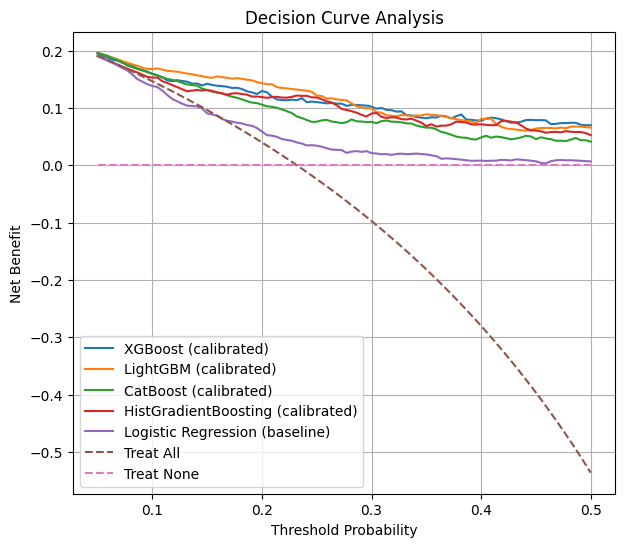

    threshold  LogisticRegression_baseline   XGBoost  LightGBM  CatBoost  \
0    0.050000                     0.190626  0.194653  0.196058  0.196313   
1    0.054545                     0.186637  0.191224  0.193508  0.193435   
2    0.059091                     0.182592  0.187841  0.190711  0.191050   
3    0.063636                     0.178650  0.184239  0.187720  0.186587   
4    0.068182                     0.174067  0.182482  0.184705  0.183659   
5    0.072727                     0.169697  0.178592  0.181725  0.179336   
6    0.077273                     0.165294  0.176906  0.178757  0.173766   
7    0.081818                     0.158197  0.173987  0.175911  0.170920   
8    0.086364                     0.150174  0.168008  0.173344  0.168135   
9    0.090909                     0.145847  0.166187  0.170010  0.165262   
10   0.095455                     0.141334  0.163280  0.167913  0.162582   
11   0.100000                     0.138273  0.159509  0.167837  0.159342   
12   0.10454

In [57]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import os

# -----------------------------
# predicted probabilities
# -----------------------------
# calibrated models
p_xgb  = xgb_cal.predict_proba(X_test_clean)[:, 1]
p_lgbm = lgbm_cal.predict_proba(X_test_clean)[:, 1]
p_cat  = cat_cal.predict_proba(X_test_clean)[:, 1]
p_hgb  = hgb_cal.predict_proba(X_test_clean)[:, 1]

# baseline logistic regression (uncalibrated)
p_base = baseline_model.predict_proba(X_test_clean)[:, 1]

y_true = y_test.to_numpy()

# -----------------------------
# thresholds for DCA
# -----------------------------
# keep your range (common in clinical DCA)
thresholds = np.linspace(0.05, 0.5, 100)

# If you ever want the full range, use:
# thresholds = np.linspace(0.01, 0.99, 200)

# -----------------------------
# Net Benefit function
# -----------------------------
def decision_curve(y_true, probs, thresholds):
    N = len(y_true)
    net_benefit = []

    for t in thresholds:
        preds = (probs >= t).astype(int)

        TP = np.sum((preds == 1) & (y_true == 1))
        FP = np.sum((preds == 1) & (y_true == 0))

        nb = (TP / N) - (FP / N) * (t / (1 - t))
        net_benefit.append(nb)

    return np.array(net_benefit)

# -----------------------------
# compute curves
# -----------------------------
nb_base = decision_curve(y_true, p_base, thresholds)

nb_xgb  = decision_curve(y_true, p_xgb, thresholds)
nb_lgbm = decision_curve(y_true, p_lgbm, thresholds)
nb_cat  = decision_curve(y_true, p_cat, thresholds)
nb_hgb  = decision_curve(y_true, p_hgb, thresholds)

# -----------------------------
# baseline strategies (Treat all / Treat none)
# -----------------------------
prevalence = np.mean(y_true)

nb_all  = prevalence - (1 - prevalence) * (thresholds / (1 - thresholds))
nb_none = np.zeros_like(thresholds)

# -----------------------------
# plot
# -----------------------------
plt.figure(figsize=(7, 6))

plt.plot(thresholds, nb_xgb,  label="XGBoost (calibrated)")
plt.plot(thresholds, nb_lgbm, label="LightGBM (calibrated)")
plt.plot(thresholds, nb_cat,  label="CatBoost (calibrated)")
plt.plot(thresholds, nb_hgb,  label="HistGradientBoosting (calibrated)")

plt.plot(thresholds, nb_base, label="Logistic Regression (baseline)")

plt.plot(thresholds, nb_all,  linestyle="--", label="Treat All")
plt.plot(thresholds, nb_none, linestyle="--", label="Treat None")

plt.xlabel("Threshold Probability")
plt.ylabel("Net Benefit")
plt.title("Decision Curve Analysis")
plt.legend()
plt.grid(True)

os.makedirs("figs", exist_ok=True)
plt.savefig("figs/decision_curve_with_baseline.png", dpi=300, bbox_inches="tight")

plt.show()

# -----------------------------
# save numerical results
# -----------------------------
dca_results = pd.DataFrame({
    "threshold": thresholds,
    "LogisticRegression_baseline": nb_base,
    "XGBoost": nb_xgb,
    "LightGBM": nb_lgbm,
    "CatBoost": nb_cat,
    "HistGradientBoosting": nb_hgb,
    "Treat_All": nb_all,
    "Treat_None": nb_none
})

print(dca_results.head(20))

os.makedirs("results", exist_ok=True)
dca_results.to_csv("results/decision_curve_results_with_baseline.csv", index=False)

print("✅ Decision curve saved to figs/decision_curve_with_baseline.png")
print("✅ Numerical DCA results saved to results/decision_curve_results_with_baseline.csv")


1) Patient-based holdout split (random_state=42)
      - Unique patient identifiers (anon_id) were extracted first.
      - Patients, not rows, were randomly split into 80% TRAIN and 20% TEST using train_test_split(random_state=42).
      - All observations belonging to a given patient were assigned exclusively to either TRAIN or TEST.
      - A sanity check confirmed that there was no patient overlap between the two sets.
      
2) Feature/target/group definition and train-test partitioning
      - The target variable was susceptibility.
      - The grouping variable used throughout the pipeline was anon_id.
      - The feature matrix was split into X_train and X_test according to the patient-level split.
      - The corresponding labels and patient-group vectors were stored as y_train, y_test, g_train, and g_test.
      - The cleaned feature matrices used downstream were X_train_clean and X_test_clean.
      
3) GroupKFold (n_splits=4) on TRAIN only (groups=anon_id)
      - Within the training set, group-aware cross-validation was defined using GroupKFold(n_splits=4).
      - The grouping variable was anon_id, ensuring that all rows from the same patient remained in the same fold.
      - These group-aware splits were reused throughout tuning, calibration, and threshold selection.
      - This preserved patient-level independence during all internal model-development steps.
      
4) Hyperparameter tuning (Optuna) using GroupKFold CV scores
      - Hyperparameters were optimized separately for each candidate ensemble model using Optuna.
      - The tuned models were XGBoost, LightGBM, CatBoost, and HistGradientBoosting.
      - For each Optuna trial, model performance was evaluated by 4-fold GroupKFold cross-validation on the training set only.
      - The optimization objective was the mean PR-AUC across folds, computed from predicted probabilities.
      - The number of Optuna trials was 20 for each model.
      - This produced one best hyperparameter configuration per model.
      
5) Fit final tuned models on full TRAIN with best_params
      - After tuning, each model was re-instantiated using its best hyperparameters.
      - The final uncalibrated tuned models were then fitted once on the full training set (X_train_clean, y_train).
      - These fitted models were saved to disk for later statistical comparison and SHAP analysis.
      - In the notebook, these saved models were later reloaded as xgb_final, lgbm_final, cat_final, and hgb_final.
      
6) Build and fit the baseline model
      - A baseline comparator was constructed using a scikit-learn Pipeline.
      - The baseline pipeline consisted of:
            * SimpleImputer(strategy="median")
            * LogisticRegression(max_iter=1000, n_jobs=-1)
      - The baseline model was trained on the same training set, X_train_clean and y_train.
      - Its predicted probabilities on X_test_clean were used to compute ROC-AUC and PR-AUC.
      - The baseline model was saved as logistic_regression_baseline.pkl.
      
7) Calibration (isotonic) with group-aware CV splits (TRAIN only)
      - Probability calibration was performed on the tuned ensemble models using CalibratedClassifierCV with method="isotonic".
      - Calibration was performed on the training set only.
      - Explicit group-aware cross-validation splits derived from GroupKFold were used during calibration.
      - This ensured that calibration remained patient-aware and avoided information leakage across patients.
      - The calibrated versions of the tuned models were saved and later reloaded as xgb_cal, lgbm_cal, cat_cal, and hgb_cal.
      - The baseline logistic regression model was not isotonic-calibrated in this pipeline.
      
8) Threshold selection from OOF calibrated probabilities (group-aware, TRAIN only)
      - Decision thresholds were not fixed at 0.5 for the tuned calibrated models.
      - Instead, model-specific thresholds were selected using out-of-fold calibrated probabilities generated on the training set only.
      - This used a nested group-aware procedure:
            * an outer GroupKFold generated out-of-fold predictions;
            * within each outer training fold, isotonic calibration was fitted again using inner group-aware splits.
      - Candidate thresholds from 0.01 to 0.99 were evaluated.
      - The selected threshold for each tuned model was the one that maximized the F1 score on the training OOF calibrated probabilities.
      - These thresholds were later used for the final held-out test evaluation.
      - By contrast, the baseline logistic regression was evaluated with a fixed threshold of 0.5.
      
9) Final evaluation on held-out TEST (calibrated tuned models + baseline)
      - Final performance evaluation was performed on the untouched held-out test set only.
      - For the tuned ensemble models, predictions were obtained from the calibrated models.
      - Each tuned model used its own threshold selected from the training set.
      - The reported test metrics were:
            * ROC-AUC
            * PR-AUC
            * Brier score
            * F1 score
            * Precision
            * Recall
      - A baseline PR-AUC equal to the positive-class prevalence in the test set was also recorded and added to the results table.
      - Separate baseline logistic-regression test results were also computed and saved.
      - The baseline logistic regression was evaluated using threshold = 0.5.
      
10) Save primary test results
      - The main tuned-model evaluation table was saved to results/model_results.csv.
      - This table included the tuned ensemble models and the baseline PR-AUC prevalence reference.
      - The separate baseline logistic-regression metrics were saved to results/baseline_logistic_regression_results.csv.
      - This created an explicit conventional baseline comparator in addition to the prevalence-based PR-AUC reference.
      
11) Patient-level bootstrap 95% CI on TEST only (for tuned models)
      - Uncertainty estimation was performed only on the held-out test set using patient-level bootstrap resampling.
      - Unique patients in the test set were sampled with replacement, and all rows belonging to each sampled patient were included in the bootstrap sample.
      - This preserved the clustered structure of repeated observations within patients.
      - For each tuned calibrated model, 300 bootstrap replicates were generated using seed=42.
      - For each replicate, ROC-AUC, PR-AUC, Brier score, F1, Precision, and Recall were recomputed.
      - The 95% confidence intervals were obtained from the 2.5th and 97.5th percentiles of the bootstrap distributions.
      - The resulting bootstrap summary table was saved to results/model_results_ci_bootstrap.csv.
      - In this section, the notebook computes bootstrap CIs for the tuned calibrated models, not for the logistic-regression baseline.
      
12) Calibration analysis on TEST: calibration curves
      - Calibration performance was examined on the held-out test set using predicted probabilities from the calibrated tuned models.
      - Calibration curves were generated using sklearn.calibration.calibration_curve.
      - The notebook produced both individual calibration-curve utilities and a combined multi-model calibration plot.
      - The reference diagonal represented perfect calibration.
      - The main calibration figure was saved to the figs directory.
      
13) Calibration analysis on TEST: ECE and confidence bands
      - Expected Calibration Error (ECE) was computed for the calibrated tuned models on the test set.
      - The ECE calculation was based on binned predicted probabilities and observed event frequencies.
      - In addition to the main calibration curves, confidence bands were generated using bootstrap resampling.
      - The calibration-band procedure used 200 bootstrap replicates.
      - When patient groups were supplied, the confidence bands were generated using patient-level bootstrap resampling rather than row-level resampling.
      - In the notebook, this was done with groups=g_test, preserving patient-level dependence.
      - The resulting calibration analysis therefore combined:
            * calibration curves,
            * ECE scores,
            * and bootstrap confidence bands on the test set.
      
14) SHAP explainability analysis on TEST sample
      - Model explainability was performed for the tuned tree-based models using SHAP.
      - The saved uncalibrated final tuned models were reloaded for this analysis:
            * xgb_final
            * lgbm_final
            * cat_final
            * hgb_final
      - A random subset of up to 5,000 test instances was drawn from X_test_clean using seed=42 to make SHAP computation tractable.
      - TreeExplainer was used for each of the four tree-based models.
      - For each model, two SHAP summary plots were generated:
            * a bar plot of global importance,
            * a beeswarm summary plot of feature effects.
      - These figures were saved in the shap directory.
      - The notebook also computed tabular SHAP importance summaries based on mean absolute SHAP values, typically retaining the top features.
      - This SHAP analysis used the final fitted tuned models rather than the calibrated wrappers.
      
15) Statistical comparison of ROC-AUC using DeLong tests
      - Pairwise statistical comparison of ROC-AUC values was performed on the test set using the DeLong test.
      - Predicted probabilities were extracted for:
            * the logistic-regression baseline,
            * XGBoost,
            * LightGBM,
            * CatBoost,
            * HistGradientBoosting.
      - In this notebook section, probabilities were taken from the saved final uncalibrated tuned models and from the baseline logistic regression.
      - The DeLong test was then used to compare ROC-AUC values between models.
      - The notebook explicitly emphasized comparisons versus the baseline model, which is appropriate for reviewer-facing significance testing.
      - Thus, this step quantified whether discrimination differences in ROC-AUC were statistically significant.
      
16) Statistical comparison of paired classifications using McNemar’s test
      - Paired classification differences between models were assessed using McNemar’s test on the held-out test set.
      - Predicted probabilities were generated for the baseline logistic regression and for the tuned ensemble models.
      - Binary predictions were then created using a fixed threshold of 0.5 in this section.
      - This means that, in the McNemar analysis as coded, model predictions were binarized with a common threshold of 0.5 rather than the model-specific optimized thresholds used in the main evaluation step.
      - McNemar contingency tables were constructed from paired correct/incorrect predictions for two models at a time.
      - The statsmodels implementation of McNemar’s test was then used to test whether paired error patterns differed significantly.
      - This step addressed whether one classifier made significantly different classification decisions than another on the same test cases.
      
17) Decision Curve Analysis (DCA) on TEST
      - Clinical utility was examined using Decision Curve Analysis on the held-out test set.
      - For this analysis, the calibrated tuned models were used:
            * xgb_cal
            * lgbm_cal
            * cat_cal
            * hgb_cal
      - The logistic-regression baseline was also included as an uncalibrated comparator.
      - Net benefit was computed across a range of threshold probabilities.
      - In the notebook, thresholds were defined as np.linspace(0.05, 0.5, 100).
      - For each threshold, binary decisions were derived from predicted probabilities and converted into net benefit values using the standard decision-curve formula.
      - This allowed comparison of clinical usefulness across plausible intervention thresholds.
      - The DCA figure was saved for downstream reporting.
      
18) Final outputs saved for reporting
      - The pipeline produced and saved:
            * tuned-model performance tables,
            * baseline logistic-regression results,
            * bootstrap confidence intervals,
            * calibration plots,
            * ECE scores,
            * SHAP plots and feature-importance tables,
            * DeLong comparison results,
            * McNemar comparison results,
            * and decision-curve figures.
      - These outputs collectively formed the full statistical, calibration, clinical-utility, and explainability evaluation package for the main pipeline.
